## Integrantes

Raful Habib Sánchez Morales — A01127380  
Efrén Alejandro Barroso Llanes — A01795861  
Michelle Alicia Graver Aguilar — A01242013

# Avance 1. Análisis Exploratorio de Datos

## Índice General

1. Configuración del Entorno y Carga de Datos  
   - 1.1 Importación de Librerías  
   - 1.2 Definición de Funciones Auxiliares  
   - 1.3 Carga del Conjunto de Datos  

2. Limpieza Inicial (antes del análisis)  
   - 2.1 Estandarización de Valores Faltantes a NaN  
   - 2.2 Eliminación de Columnas No Informativas, Data Leakage y Control Interno  
   - 2.3 Corrección de Inconsistencias en Categorías
   - 2.4 Corrección de Tipos de Dato  
   - 2.5 Corrección de la Variable Objetivo

3. Diagnóstico Estructural  
   - 3.1 Resumen con info()  
   - 3.2 Valores Únicos por Variable (nunique ordenado)  
   - 3.3 Conteo de Categorías (value_counts)  
   - 3.4 Estadísticas Descriptivas (numéricas y categóricas por separado)  

4. Análisis de Valores Faltantes  
   - 4.1 Reporte con Umbral  
   - 4.2 Prueba de Hipótesis para Decidir Imputación  
   - 4.3 Mapa de Calor de Valores Faltantes  
   - 4.4 Imputación con Mediana  

5. Análisis Univariante  
   - 5.1 Variable Objetivo  
   - 5.2 Histogramas y Densidad (subplots)  
   - 5.3 Boxplots (subplots)  

6. Análisis Bivariante  
   - 6.1 Variable Objetivo vs Categóricas (barras apiladas normalizadas)  
   - 6.2 Variable Objetivo vs Numéricas (matriz compacta, sin atípicos)  

7. Análisis de Correlación  
   - 7.1 Matriz Filtrada por Umbral  

8. PCA Exploratorio  
   - 8.1 Proyección 2D coloreada por clase del target  

9. Conclusiones Finales  

10. Bibliografía

## 1. Configuración del Entorno y Carga de Datos
### 1.1 Importación de Librerías

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import warnings

from scipy.stats import chi2_contingency, ttest_ind
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline

warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

### 1.2 Definición de Funciones Auxiliares

In [ ]:
def diagnosticar_faltantes_numerica(df, columna, mascara_mv):
    """Diagnóstico de valores faltantes para variable numérica."""
    etiquetas = {True: 'Con faltantes', False: 'Sin faltantes'}
    grupos = {}
    for val in mascara_mv.unique():
        grupos[val] = df[mascara_mv == val][columna].dropna()

    fig, axes = plt.subplots(1, 3, figsize=(14, 4))

    # Boxplot comparativo
    axes[0].boxplot([grupos[k] for k in sorted(grupos)], vert=False,
                    labels=[etiquetas[k] for k in sorted(grupos)])
    axes[0].set_xlabel(columna)
    axes[0].set_title('Boxplot comparativo')

    # Histogramas
    rng = (df[columna].min(), df[columna].max())
    for i, val in enumerate(sorted(grupos)):
        ax = axes[i + 1]
        ax.hist(grupos[val], color='skyblue', edgecolor='white')
        ax.set_xlim(rng)
        ax.set_title(etiquetas[val])
        ax.set_xlabel(columna)

    plt.suptitle(f'Diagnóstico de faltantes: {columna}', fontsize=11)
    plt.tight_layout()
    plt.show()

    p_valor = ttest_ind(grupos[True], grupos[False]).pvalue if (True in grupos and False in grupos) else None
    if p_valor is not None:
        print(f'  p-value t-test: {p_valor:.4f}  →  {"MCAR" if p_valor > 0.05 else "MAR/MNAR"}')


def diagnosticar_faltantes_categorica(df, columna, mascara_mv):
    """Diagnóstico de valores faltantes para variable categórica."""
    etiquetas = {True: 'Con faltantes', False: 'Sin faltantes'}
    valores_presentes = [v for v in mascara_mv.unique() if not df[mascara_mv == v][columna].value_counts().empty]

    n = len(valores_presentes)
    if n == 0:
        print(f'  Sin datos suficientes para {columna}')
        return

    fig, axes = plt.subplots(1, n, figsize=(6 * n, 4))
    if n == 1:
        axes = [axes]

    for i, val in enumerate(valores_presentes):
        subset = df[mascara_mv == val][columna].dropna()
        if len(subset) > 0:
            subset.value_counts().plot.bar(ax=axes[i], color='skyblue', edgecolor='white')
            axes[i].set_title(etiquetas[val])
            axes[i].tick_params(axis='x', rotation=30)

    plt.suptitle(f'Diagnóstico de faltantes: {columna}', fontsize=11)
    plt.tight_layout()
    plt.show()

    try:
        tabla = pd.crosstab(mascara_mv, df[columna].fillna('_NaN_'))
        p_valor = chi2_contingency(tabla)[1]
        print(f'  p-value chi²: {p_valor:.4f}  →  {"MCAR" if p_valor > 0.05 else "MAR/MNAR"}')
    except Exception:
        print('  No se pudo calcular chi².')

### 1.3 Carga del Conjunto de Datos

In [ ]:
df = pd.read_csv('psoriasis.csv')
print(f'Filas: {df.shape[0]}  |  Columnas: {df.shape[1]}')
df.head()

Filas: 947  |  Columnas: 374


,Study,GEO identifier,Database,Published paper associated,Platform used,Condition/control,Patient ID,Age,Sex,Ethnicity,Race,Duration of psoriasis (years),Psoriasis Area and Severity Index,Psoriasis Area and Severity Index2,BSA,"Current Treatment (>2 weeks prior for topical, >4 weeks prior for systemic)",Previous treatments for psoriasis,Psoriasis Family history,Has psoriasis family history?,Alcohol (>10 drinks pr week),Smoking,Body mass index,BMI >30,Type of sample,Lesional/Non-lesional,Part of the body of which the sample was taken,Climate conditions,Season of the year,Volunteers/Cell bank,Stress,Psoriatic arthritis?,Hypertension?,Metabolic syndrome?,Diabetes type 2?,Hyperlipidimia?,ACE 209749_s_at,ACE 227463_at,AHR 202820_at,AQP3 203747_at,AQP3 39248_at,AQP3 39249_at,B2M 201891_s_at,B2M 216231_s_at,B2M 232311_at,BIN2 219191_s_at,BSG 208677_s_at,C10orf99 227735_s_at,C10orf99 227736_at,C1QTNF2 223749_at,CAMP 210244_at,CAPN12 228705_at,CARD14 1555308_at,CARD14 1555309_a_at,CARD14 220598_at,CARD14 220599_s_at,CARD14 224113_at,CARD14 232608_x_at,CCHCR1 209698_at,CCHCR1 37424_at,CCHCR1 37425_g_at,CCHCR1 42361_g_at,CCL19 210072_at,CCL2 216598_s_at,CCL20 205476_at,CCL22 207861_at,CCL27 207955_at,CCL5 1405_i_at,CCL5 1555759_a_at,CCL5 204655_at,CCL8 214038_at,CCR6 206983_at,CCR7 206337_at,CD207 220428_at,CD3D 213539_at,CD3E 205456_at,CD3G 206804_at,CD4 203547_at,CD4 216424_at,CD83 204440_at,CD86 205685_at,CD86 205686_s_at,CD86 210895_s_at,CD8A 205758_at,CDSN 206192_at,CDSN 206193_s_at,CHRM3 1553705_a_at,CHRM3 1559633_a_at,CHRM3 1559634_at,CHRM3 1564339_a_at,CHRM3 214596_at,CHRM3 242488_at,CHUK 209666_s_at,CIITA 205101_at,CIITA 210925_at,CIITA 211884_s_at,CLDN1 218182_s_at,CLDN1 222549_at,CRAT 205843_x_at,CRAT 209522_s_at,CXCL1 204470_at,CXCL10 204533_at,CXCL11 210163_at,CXCL11 211122_s_at,CXCL2 1569203_at,CXCL2 209774_x_at,CXCL2 230101_at,CXCL6 206336_at,CXCL8 202859_x_at,CXCL8 211506_s_at,CXCL9 203915_at,CXXC5 222996_s_at,CXXC5 224516_s_at,CXXC5 233955_x_at,DEFB1 210397_at,DEFB103A /// DEFB103B 224239_at,DEFB4A /// DEFB4B 207356_at,DSC1 207324_s_at,DSG1 206642_at,ELOVL3 234513_at,ERAP1 209701_at,ERAP1 209788_s_at,ERAP1 210385_s_at,ERAP1 214012_at,ERAP1 214034_at,FABP5 202345_s_at,FADS1 /// MIR1908 208962_s_at,FADS1 /// MIR1908 208963_x_at,FADS1 /// MIR1908 208964_s_at,FCGR2A 1565673_at,FCGR2A 203561_at,FLG 215704_at,FOXP3 221333_at,FOXP3 221334_s_at,FOXP3 224211_at,HIF1A 200989_at,HLA-A 213932_x_at,HLA-A 215313_x_at,HLA-B 208729_x_at,HLA-B 209140_x_at,HLA-B 211911_x_at,HLA-C 208812_x_at,HLA-C 211799_x_at,HLA-C 214459_x_at,HLA-C 216526_x_at,HLA-DPA1 211990_at,HLA-DPA1 211991_s_at,HLA-DPA1 213537_at,HLA-DPB1 201137_s_at,HLA-DPB1 244485_at,HLA-DQA1 203290_at,HLA-DRB1 /// HLA-DRB1 208306_x_at,HSD3B1 204515_at,HSD3B1 241111_at,ICOS 210439_at,IDO1 210029_at,IFI27 202411_at,IFI44 214059_at,IFI44 214453_s_at,IFI44L 204439_at,IFIH1 1555464_at,IFIH1 216020_at,IFIH1 219209_at,IFNG 210354_at,IFNGR2 201642_at,IFNLR1 1555499_a_at,IFNLR1 244261_at,IKBKB 209341_s_at,IKBKB 209342_s_at,IKBKB 211027_s_at,IL10 207433_at,IL10RB 209575_at,IL12B 207901_at,IL12RB1 1552584_at,IL12RB1 206890_at,IL12RB1 239522_at,IL13 207844_at,IL17A 208402_at,IL17A 216876_s_at,IL17C 224079_at,IL17F 234408_at,IL17RA 205707_at,IL17RA 228685_at,IL17RA 229101_at,IL17RA 229295_at,IL17RB 219255_x_at,IL17RB 224156_x_at,IL17RB 224361_s_at,IL17RC 221926_s_at,IL17RC 224514_x_at,IL17RC 64440_at,IL17RD 227997_at,IL17RD 229263_at,IL17RE 229401_at,IL17RE 236186_x_at,IL18 206295_at,IL19 220745_at,IL1B 205067_at,IL1B 39402_at,IL20 224071_at,IL21 221271_at,IL22 221165_s_at,IL22 222974_at,IL22RA1 220056_at,IL23A 220054_at,IL23R 1552912_a_at,IL23R 1561853_a_at,IL26 221111_at,IL2RG 204116_at,IL33 209821_at,IL36A 221404_at,IL36B 224230_at,IL36B 231755_at,IL36G 220322_at,IL36RN 222223_s_at,IL4 207538_at,IL4 207539_s_at,IL6 205207_at,IRAK2 1553739_at,IRAK2 1553740_a_at,IRAK2 231779_at,IRF1 202531_at,IRF1 238725_at,IRF7 208436_s_at,ISG15 205483_s_at,ITGAX 1563003_at,ITGAX 210184_at,IVL 214599_at,JAK

---
## 2. Limpieza Inicial (antes del análisis)
### 2.1 Estandarización de Valores Faltantes a NaN

Se estandarizan todas las representaciones de ausencia que el CSV pueda contener antes de cualquier análisis, para que `describe()` y `info()` los contabilicen correctamente.

In [ ]:
VAR_OBJETIVO = 'Condition/control'

In [ ]:
VALORES_NULOS = ['NOT REPORTED', ' NOT REPORTED', 'Not reported', 'Not reported ',
                 'N/A', 'NA', ' NA', 'UNKNOWN', '', ' ']

df.replace(VALORES_NULOS, np.nan, inplace=True)
print('Estandarización completada.')

Estandarización completada.


### 2.2 Eliminación de Columnas No Informativas, Data Leakage y Control Interno

Se eliminan **antes** del análisis las columnas que:
- No aportan valor informativo (metadatos de estudio).
- Representan *data leakage* (variables que revelan directamente el diagnóstico o son consecuencia de él).
- Son de control interno y no tienen valor clínico para el modelado.
- Son constantes o casi constantes (no aportan variabilidad).

El índice original del DataFrame ya identifica de forma única cada registro, por lo que **no se crea una columna `id` adicional**.

In [ ]:
# Columnas sin valor informativo (metadatos del estudio)
cols_no_informativas = [
    'Study', 'GEO identifier', 'Database',
    'Published paper associated', 'Platform used', 'Patient ID'
]

# Columnas de control interno y muestreo (no clínicas)
cols_control_interno = [
    'Type of sample',
    'Part of the body of which the sample was taken',
    'Volunteers/Cell bank'
]

# Columnas con data leakage (revelan o son consecuencia directa del diagnóstico)
cols_leakage = [
    'Duration of psoriasis (years)',
    'Psoriasis Area and Severity Index',
    'Psoriasis Area and Severity Index2',
    'BSA',
    'Current Treatment (>2 weeks prior for topical, >4 weeks prior for systemic)',
    'Previous treatments for psoriasis',
    'Psoriasis Family history',       # duplicado de la siguiente
    'Has psoriasis family history?'
]

#    'Psoriasis Area and Severity Index2',
#    'Lesional/Non-lesional'

# Columnas constantes o casi sin variabilidad útil
cols_constantes = ['Units', 'Body mass index']

# Columnas categóricas no utilizadas
cols_cat = ['Ethnicity', 'Race', 'Smoking', 'BMI >30', 'Age']

todas_a_eliminar = cols_no_informativas + cols_control_interno + cols_leakage + cols_constantes + cols_cat

# Solo eliminamos las que existan en el DataFrame
presentes = [c for c in todas_a_eliminar if c in df.columns]
df.drop(columns=presentes, inplace=True)

print(f'Columnas eliminadas: {len(presentes)}')
print(f'Dimensiones actuales → Filas: {df.shape[0]}  |  Columnas: {df.shape[1]}')

Columnas eliminadas: 24
Dimensiones actuales → Filas: 947  |  Columnas: 350


### 2.3 Corrección de Inconsistencias en Categorías

Se corrigen espacios y variaciones tipográficas en las variables categóricas **antes** de cualquier análisis.

In [ ]:
# Corrección de Sex
if 'Sex' in df.columns:
    df['Sex'] = df['Sex'].str.strip()

# Corrección de Psoriasis Area and Severity Index2
if 'Psoriasis Area and Severity Index2' in df.columns:
    df['Psoriasis Area and Severity Index2'] = df['Psoriasis Area and Severity Index2'].str.strip().str.upper()

# Corrección de Lesional/Non-lesional
if 'Lesional/Non-lesional' in df.columns:
    df['Lesional/Non-lesional'] = df['Lesional/Non-lesional'].str.strip().str.upper()

print('Corrección de inconsistencias completada.')

# Verificar resultados
for col in ['Sex','Psoriasis Area and Severity Index2','Lesional/Non-lesional']:
    if col in df.columns:
        print(f'\n{col}:')
        print(df[col].value_counts(dropna=False))

Corrección de inconsistencias completada.

Sex:
Sex
M      393
NaN    285
F      269
Name: count, dtype: int64

Lesional/Non-lesional:
Lesional/Non-lesional
LESIONAL                  308
NON-LESIONAL              249
NaN                       232
NL                         40
LS                         39
N                          29
UNINVOLVED SKIN, NS-7       1
LESION SKIN, LS-6           1
UNINVOLVED SKIN, NS-9       1
LESION SKIN, LS-9           1
LESION SKIN, LS-10          1
UNINVOLVED SKIN, NS-11      1
LESION SKIN, LS-11          1
UNINVOLVED SKIN, NS-12      1
LESION SKIN, LS-12          1
UNINVOLVED SKIN, NS-13      1
LESION SKIN, LS-13          1
UNINVOLVED SKIN, NS-14      1
LESION SKIN, LS-14          1
LESION SKIN, LS-15          1
UNINVOLVED SKIN, NS-16      1
LESION SKIN, LS-7           1
UNINVOLVED SKIN, NS-8       1
LESION SKIN, LS-8           1
LESION SKIN, LS-17          1
UNINVOLVED SKIN, NS-17      1
LESION SKIN, LS-16          1
UNINVOLVED SKIN, NS-18      1
UNI

### 2.4 Corrección de Tipos de Dato

Se convierten a numérico las columnas que deberían serlo pero llegaron como `object` por contener cadenas de texto como "NOT REPORTED" (ya sustituidas por NaN en el paso 2.1).

In [ ]:
# Columnas que deben ser numéricas (todas excepto la variable objetivo y las categóricas conocidas)
COLS_CATEGORICAS_CONOCIDAS = [VAR_OBJETIVO, 'Sex', 'Psoriasis Area and Severity Index2',
'Lesional/Non-lesional']
COLS_CATEGORICAS_CONOCIDAS = [c for c in COLS_CATEGORICAS_CONOCIDAS if c in df.columns]

cols_object = df.select_dtypes(include='object').columns.tolist()
cols_a_convertir = [c for c in cols_object if c not in COLS_CATEGORICAS_CONOCIDAS]

if cols_a_convertir:
    df[cols_a_convertir] = df[cols_a_convertir].apply(pd.to_numeric, errors='coerce')
    print(f'Columnas convertidas a numérico: {len(cols_a_convertir)}')
else:
    print('No se requirieron conversiones adicionales de tipo.')

# Definir listas globales de columnas para usar en el resto del notebook
COLS_CATEGORICAS = [c for c in COLS_CATEGORICAS_CONOCIDAS if c != VAR_OBJETIVO]
COLS_NUMERICAS   = df.select_dtypes(include=np.number).columns.tolist()

print(f'\nVariables categóricas ({len(COLS_CATEGORICAS)}): {COLS_CATEGORICAS}')
print(f'Variables numéricas   ({len(COLS_NUMERICAS)})')

Columnas convertidas a numérico: 98

Variables categóricas (2): ['Sex', 'Lesional/Non-lesional']
Variables numéricas   (347)


### 2.5 Corrección de la Variable Objetivo

Con `value_counts()` se detectan las clases presentes en `Condition/control`. Se identificó la categoría `'Atopic dermatitis'`, que requiere un tratamiento especial por las siguientes razones biológicas:

> *"Los pacientes con dermatitis atópica siguen presentando una condición inflamatoria cutánea y un perfil inmunológico distinto al de individuos verdaderamente sanos. Reclasificarlos como 'sanos' podría introducir sesgo biológico en el modelo, especialmente considerando que ambas enfermedades comparten algunos componentes inflamatorios pero presentan mecanismos moleculares diferentes."*  
> — Dra. Mariana (comunicación personal, mayo 2026)

**Decisión tomada:** Se crea una columna indicadora `Atopic_dermatitis` (valores `'Sí'` / `'No'`) para **preservar la información** de estos pacientes en el dataset y dejar abierta la posibilidad de un análisis multi-enfermedad futuro. Posteriormente, sus registros se **excluyen** del estudio principal de clasificación binaria Psoriasis vs. Control sano, ya que reclasificarlos como controles sanos introduciría el sesgo señalado por la Dra.

Para validar la consistencia de la información, se calcula una cifra de control sobre las variables que contienen información genética.

In [ ]:
df_resp_pre = df.copy()
df_resp_pre['cifra_control'] = df_resp_pre[COLS_NUMERICAS].sum(axis=1)

In [ ]:
print('Clases detectadas antes de la corrección:')
print(df[VAR_OBJETIVO].value_counts())

# Paso 1: Excluir los registros de Atopic dermatitis del estudio binario
# (No se reclasifican como sanos para evitar sesgo biológico — ver justificación)
df = df[df[VAR_OBJETIVO] != 'Atopic dermatitis'].copy()

# Paso 2: Normalizar espacios en las etiquetas restantes
df[VAR_OBJETIVO] = df[VAR_OBJETIVO].str.strip()

print('\nClases después de la corrección (estudio binario):')
print(df[VAR_OBJETIVO].value_counts())
print(f'\nDimensiones actuales → Filas: {df.shape[0]}  |  Columnas: {df.shape[1]}')

Clases detectadas antes de la corrección:
Condition/control
Psoriasis            423
Atopic dermatitis    302
Healthy              221
Healthy                1
Name: count, dtype: int64

Clases después de la corrección (estudio binario):
Condition/control
Psoriasis    423
Healthy      222
Name: count, dtype: int64

Dimensiones actuales → Filas: 645  |  Columnas: 350


Para validar la consistencia de la información, se calcula una cifra de control sobre las variables que contienen información genética, con los registros correspondientes a la categoría 'Atopic dermatitis' excluidos.

In [ ]:
df_resp_post = df.copy()
df_resp_post['cifra_control'] = df_resp_post[COLS_NUMERICAS].sum(axis=1)

Validación de consistencia de la información antes y después de la eliminación de los registros correspondientes a la categoría excluida de la variable objetivo, con el fin de detectar posibles inconsistencias o corroborar que la información permanece íntegra.

In [ ]:
# Índices finales, despues de eliminar la categoria
indices_comunes = df_resp_post.index

# Comparar solo esos registros
pre_filtrado  = df_resp_pre.loc[indices_comunes, 'cifra_control']
post_filtrado = df_resp_post.loc[indices_comunes, 'cifra_control']

diferencias = pre_filtrado[pre_filtrado != post_filtrado]

if diferencias.empty:
    print(f"✓ Validación exitosa — {len(indices_comunes)} registros coinciden")
    print(f"  Registros eliminados: {len(df_resp_pre) - len(df_resp_post)}")
else:
    print(f"✗ {len(diferencias)} registros con diferencias:")
    print(pd.DataFrame({
        'cifra_pre':  pre_filtrado.loc[diferencias.index],
        'cifra_post': post_filtrado.loc[diferencias.index],
        'diferencia': post_filtrado.loc[diferencias.index] - pre_filtrado.loc[diferencias.index]
    }))

✓ Validación exitosa — 645 registros coinciden
  Registros eliminados: 302


---
## 3. Diagnóstico Estructural
### 3.1 Resumen con info()

Se utiliza `info()` en lugar de `dtypes` porque resume en una sola salida: nombres de columna, tipo de dato, cantidad de valores no nulos y conteo por tipo al final.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 645 entries, 0 to 946
Columns: 350 entries, Condition/control to XCL1 206366_x_at
dtypes: float64(347), object(3)
memory usage: 1.7+ MB


### 3.2 Valores Únicos por Variable (nunique ordenado)

Se ordena de menor a mayor para identificar rápidamente:
- Variables con muy pocos valores únicos → posiblemente categóricas aunque estén como numéricas.
- El caso de `Age`: al tener pocos valores únicos se detecta que son rangos de edad (pseudo-categórica), lo que justifica su exclusión del análisis numérico.

In [ ]:
nunique_ordenado = df.nunique().sort_values()
display(nunique_ordenado)

# Verificar Age si existe
if 'Age' in df.columns:
    print(f"\nValores únicos de Age ({df['Age'].nunique()}): {sorted(df['Age'].dropna().unique())}")
    print("→ Son rangos de edad traslapados; se trata como categórica y se excluye del análisis numérico.")

,0
Alcohol (>10 drinks pr week),0
Stress,0
Season of the year,0
Climate conditions,0
Psoriatic arthritis?,0
Diabetes type 2?,0
Metabolic syndrome?,0
Hypertension?,0
Hyperlipidimia?,0
Condition/control,2


### 3.3 Conteo de Categorías (value_counts)

Se revisan las distribuciones de cada variable categórica **antes** de las estadísticas descriptivas para detectar posibles anomalías o clases raras.

In [ ]:
cols_para_vc = COLS_CATEGORICAS + [VAR_OBJETIVO]
for col in cols_para_vc:
    if col in df.columns:
        print(f'--- {col} ---')
        print(df[col].value_counts(dropna=False))
        print()

--- Sex ---
Sex
NaN    250
M      242
F      153
Name: count, dtype: int64

--- Lesional/Non-lesional ---
Lesional/Non-lesional
NaN                       222
NON-LESIONAL              172
LESIONAL                  172
N                          29
UNINVOLVED SKIN, NS-7       1
LESION SKIN, LS-6           1
UNINVOLVED SKIN, NS-8       1
LESION SKIN, LS-8           1
UNINVOLVED SKIN, NS-9       1
LESION SKIN, LS-9           1
LESION SKIN, LS-10          1
UNINVOLVED SKIN, NS-11      1
LESION SKIN, LS-11          1
UNINVOLVED SKIN, NS-12      1
LESION SKIN, LS-12          1
UNINVOLVED SKIN, NS-13      1
LESION SKIN, LS-13          1
UNINVOLVED SKIN, NS-14      1
LESION SKIN, LS-14          1
LESION SKIN, LS-15          1
UNINVOLVED SKIN, NS-16      1
LESION SKIN, LS-7           1
LESION SKIN, LS-16          1
UNINVOLVED SKIN, NS-17      1
UNINVOLVED SKIN, NS-18      1
LESION SKIN, LS-17          1
UNINVOLVED SKIN, NS-19      1
LESION SKIN, LS-19          1
UNINVOLVED SKIN, NS-20      1
LE

### 3.4 Estadísticas Descriptivas

Se separan **numéricas** y **categóricas** para evitar la mezcla de métricas que generaría `describe(include='all')`.

In [ ]:
print('=== Estadísticas descriptivas — Variables NUMÉRICAS ===')
display(df[COLS_NUMERICAS].describe().T)

=== Estadísticas descriptivas — Variables NUMÉRICAS ===


,count,mean,std,min,25%,50%,75%,max
Alcohol (>10 drinks pr week),0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Climate conditions,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Season of the year,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Stress,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Psoriatic arthritis?,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Hypertension?,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Metabolic syndrome?,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Diabetes type 2?,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Hyperlipidimia?,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ACE 209749_s_at,645.0,4.110944,9.214926,-5.070000,0.265751,2.170000,2.462075,130.800000


In [ ]:
cols_cat_existentes = [c for c in COLS_CATEGORICAS + [VAR_OBJETIVO] if c in df.columns]
print('=== Estadísticas descriptivas — Variables CATEGÓRICAS ===')
display(df[cols_cat_existentes].describe().T)

=== Estadísticas descriptivas — Variables CATEGÓRICAS ===


,count,unique,top,freq
Sex,395,2,M,242
Lesional/Non-lesional,423,53,NON-LESIONAL,172
Condition/control,645,2,Psoriasis,423


---
## 4. Análisis de Valores Faltantes
### 4.1 Reporte con Umbral

El umbral se declara como variable para facilitar modificarlo más adelante. Solo se muestran las variables que **superan** el umbral. El reporte se ordena de mayor a menor porcentaje.

In [ ]:
UMBRAL_FALTANTES = 0.40   # Modificar aquí para cambiar el criterio

pct_faltantes = df.isnull().mean().sort_values(ascending=False)
pct_faltantes = pct_faltantes[pct_faltantes > 0]

print(f'Umbral declarado: {UMBRAL_FALTANTES * 100:.0f}%\n')

cols_a_eliminar_mv  = pct_faltantes[pct_faltantes >  UMBRAL_FALTANTES].index.tolist()
cols_a_imputar_mv   = pct_faltantes[pct_faltantes <= UMBRAL_FALTANTES].index.tolist()

print(f'Variables a ELIMINAR (> {UMBRAL_FALTANTES*100:.0f}% faltantes) → {len(cols_a_eliminar_mv)} columnas:')
for col in cols_a_eliminar_mv:
    print(f'  ✗  {col:45s}  {pct_faltantes[col]*100:.1f}%')

print(f'\nVariables a IMPUTAR (<= {UMBRAL_FALTANTES*100:.0f}% faltantes) → {len(cols_a_imputar_mv)} columnas:')
for col in cols_a_imputar_mv:
    print(f'  ✓  {col:45s}  {pct_faltantes[col]*100:.1f}%')

Umbral declarado: 40%

Variables a ELIMINAR (> 40% faltantes) → 9 columnas:
  ✗  Alcohol (>10 drinks pr week)                   100.0%
  ✗  Psoriatic arthritis?                           100.0%
  ✗  Stress                                         100.0%
  ✗  Season of the year                             100.0%
  ✗  Climate conditions                             100.0%
  ✗  Hypertension?                                  100.0%
  ✗  Hyperlipidimia?                                100.0%
  ✗  Metabolic syndrome?                            100.0%
  ✗  Diabetes type 2?                               100.0%

Variables a IMPUTAR (<= 40% faltantes) → 100 columnas:
  ✓  Sex                                            38.8%
  ✓  Lesional/Non-lesional                          34.4%
  ✓  STAT1 AFFX-HUMISGF3A/M97935_3_at               7.4%
  ✓  STAT1 AFFX-HUMISGF3A/M97935_MB_at              7.4%
  ✓  STAT1 AFFX-HUMISGF3A/M97935_MA_at              7.4%
  ✓  STAT1 AFFX-HUMISGF3A/M97935_5_at             

In [ ]:
df.drop(columns=cols_a_eliminar_mv, inplace=True)

# Actualizar listas globales
COLS_CATEGORICAS = [c for c in COLS_CATEGORICAS if c in df.columns]
COLS_NUMERICAS   = df.select_dtypes(include=np.number).columns.tolist()

print(f'Columnas eliminadas por faltantes: {len(cols_a_eliminar_mv)}')
print(f'Dimensiones actuales → Filas: {df.shape[0]}  |  Columnas: {df.shape[1]}')

Columnas eliminadas por faltantes: 9
Dimensiones actuales → Filas: 645  |  Columnas: 341


### 4.2 Prueba de Hipótesis para Decidir Imputación

Para las variables que **no** superaron el umbral se realiza la prueba de hipótesis para determinar el mecanismo de ausencia (MCAR/MAR/MNAR). Esto guía la estrategia de imputación.

- **Variables numéricas** → prueba t para comparar distribución entre registros con y sin faltantes.
- **Variables categóricas** → prueba Chi² sobre la tabla de contingencia.

Variables a imputar (categóricas): ['Sex', 'Lesional/Non-lesional']
Variables a imputar (numéricas):   ['STAT1 AFFX-HUMISGF3A/M97935_3_at', 'STAT1 AFFX-HUMISGF3A/M97935_MB_at', 'STAT1 AFFX-HUMISGF3A/M97935_MA_at', 'STAT1 AFFX-HUMISGF3A/M97935_5_at', 'TLR4 224341_x_at', 'VNN3 1553514_a_at', 'TLR4 1552798_a_at', 'TLR4 232068_s_at', 'TNFRSF11A 238846_at', 'THRSP 1553583_a_at', 'CARD14 1555308_at', 'CARD14 1555309_a_at', 'CARD14 224113_at', 'CARD14 232608_x_at', 'STAT3 225289_at', 'THRSP 229477_at', 'THRSP 229476_s_at', 'CAPN12 228705_at', 'SPRR2G 236119_s_at', 'CCL5 1555759_a_at', 'SOCS3 227697_at', 'RORC 228806_at', 'RNASE7 234700_s_at', 'RNASE7 234699_at', 'RNASE7 233488_at', 'REL 239486_at', 'REL 235242_at', 'REL 228812_at', 'PTPN22 236539_at', 'PTGS2 1554997_a_at', 'PSORS1C3 238997_at', 'STAT3 243213_at', 'TAP2 225973_at', 'WFDC12 1553081_at', 'NFKBIZ 223217_s_at', 'NFKBIZ 223218_s_at', 'NLRC5 226474_at', 'NFKBIA 231699_at', 'CHRM3 1559634_at', 'CLDN1 222549_at', 'CHRM3 242488_at', 'C

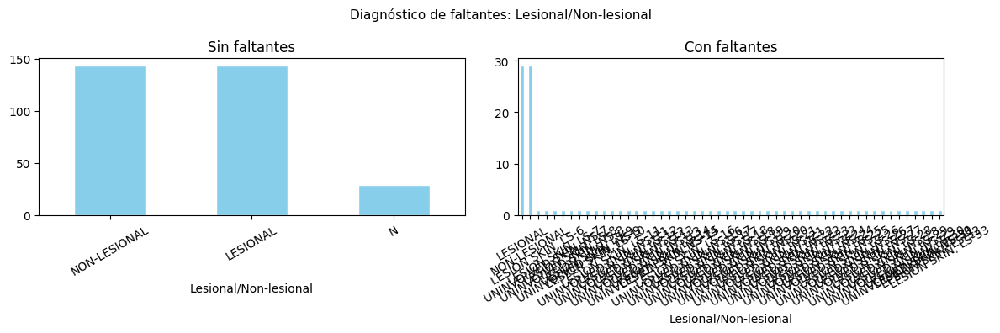

  p-value chi²: 0.0000  →  MAR/MNAR

Variable diagnóstico base: Lesional/Non-lesional


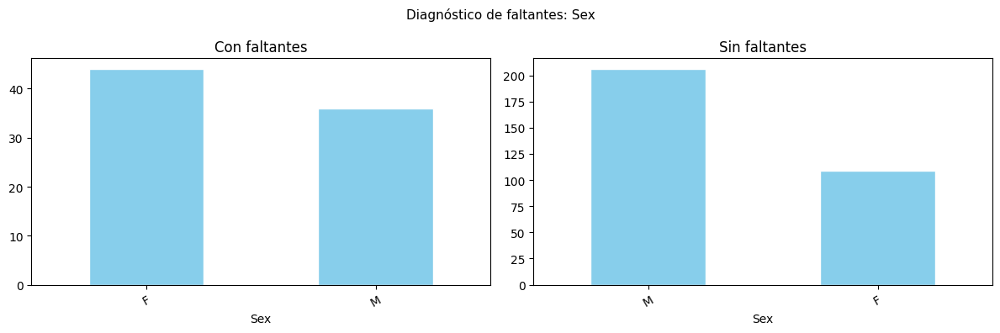

  p-value chi²: 0.0000  →  MAR/MNAR

--- Diagnóstico numéricas ---


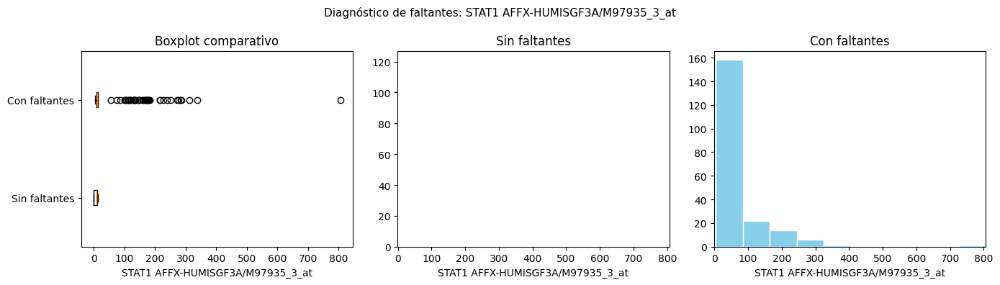

  p-value t-test: 0.0000  →  MAR/MNAR


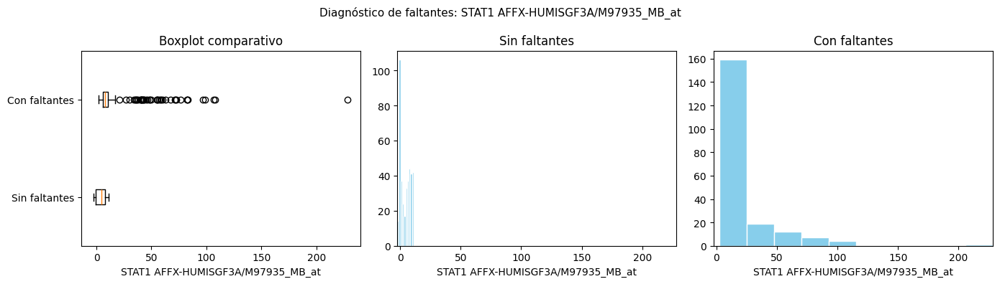

  p-value t-test: 0.0000  →  MAR/MNAR


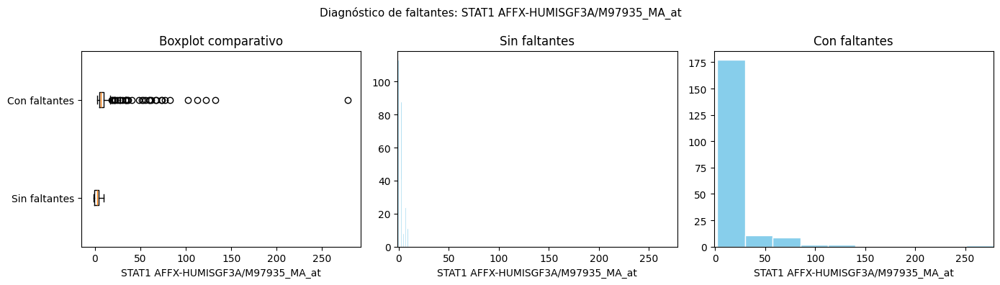

  p-value t-test: 0.0000  →  MAR/MNAR


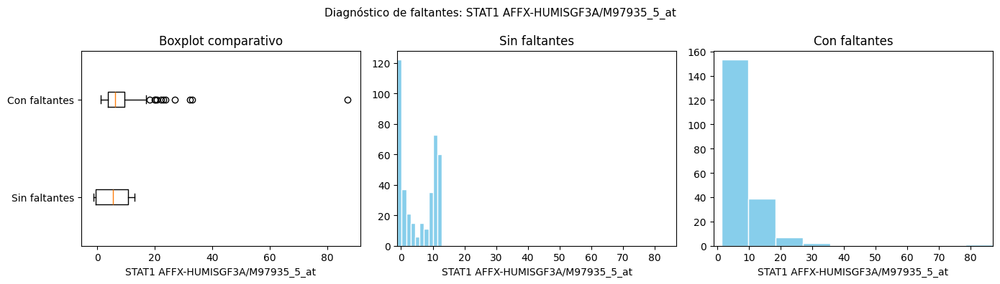

  p-value t-test: 0.0000  →  MAR/MNAR


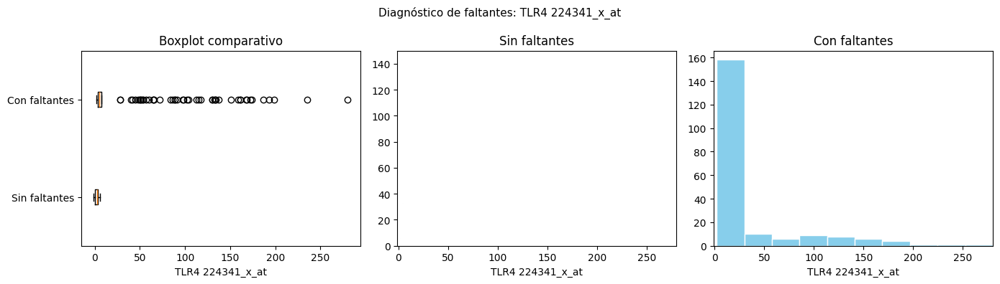

  p-value t-test: 0.0000  →  MAR/MNAR


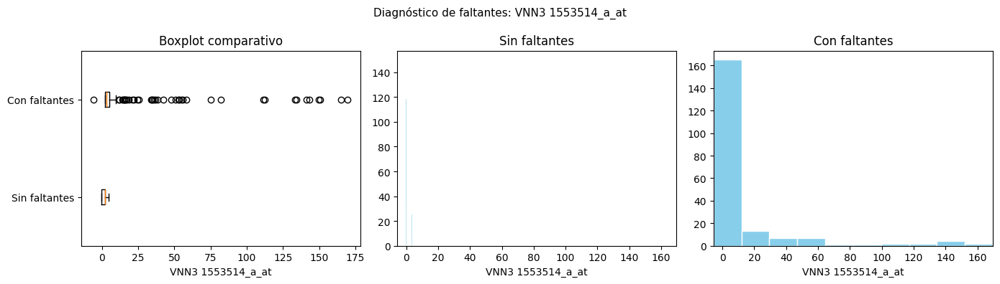

  p-value t-test: 0.0000  →  MAR/MNAR


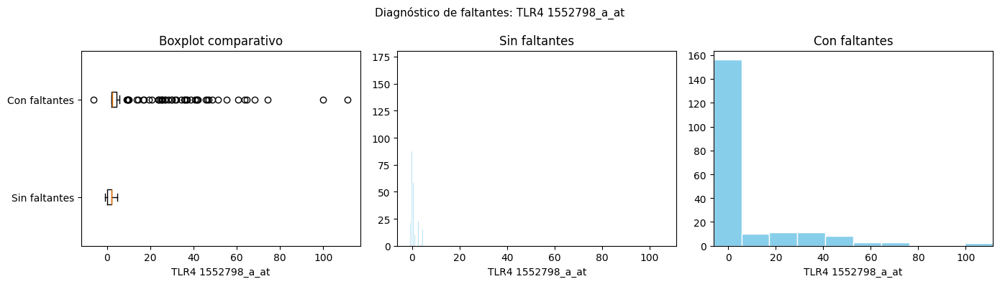

  p-value t-test: 0.0000  →  MAR/MNAR


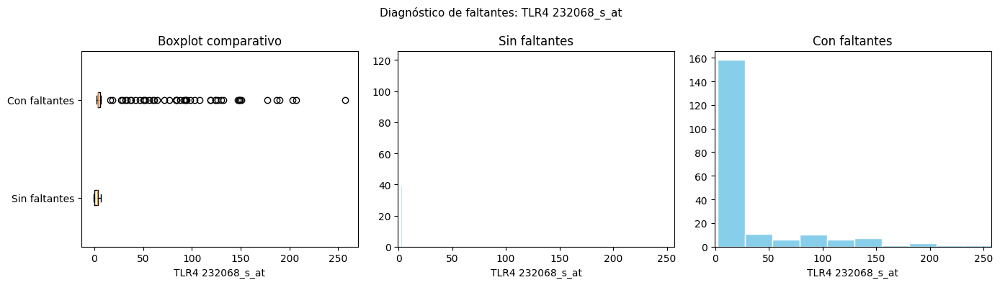

  p-value t-test: 0.0000  →  MAR/MNAR


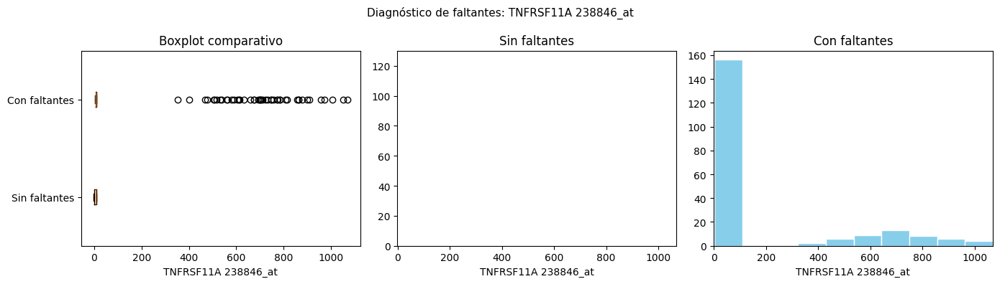

  p-value t-test: 0.0000  →  MAR/MNAR


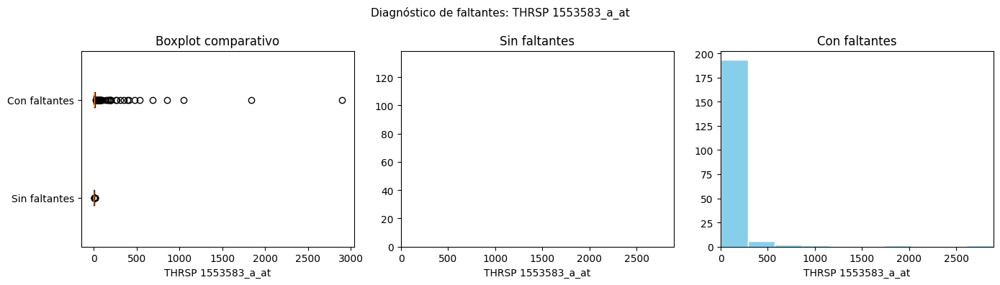

  p-value t-test: 0.0000  →  MAR/MNAR


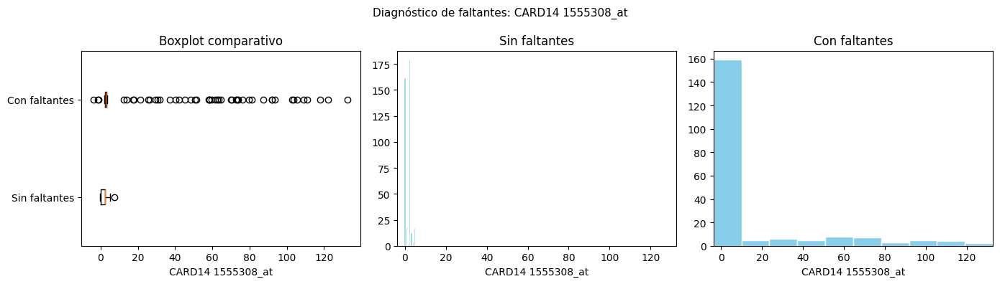

  p-value t-test: 0.0000  →  MAR/MNAR


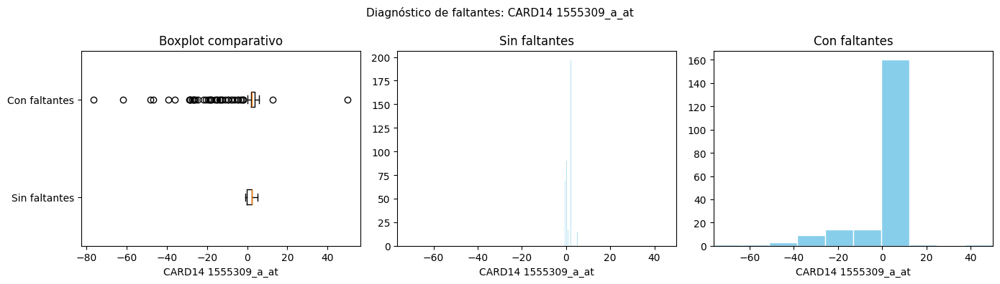

  p-value t-test: 0.0000  →  MAR/MNAR


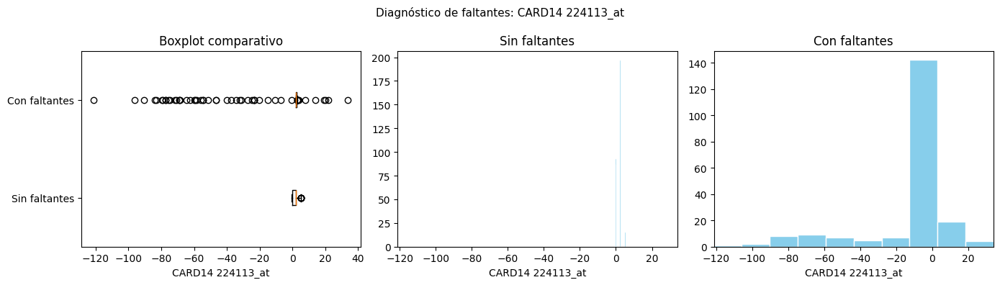

  p-value t-test: 0.0000  →  MAR/MNAR


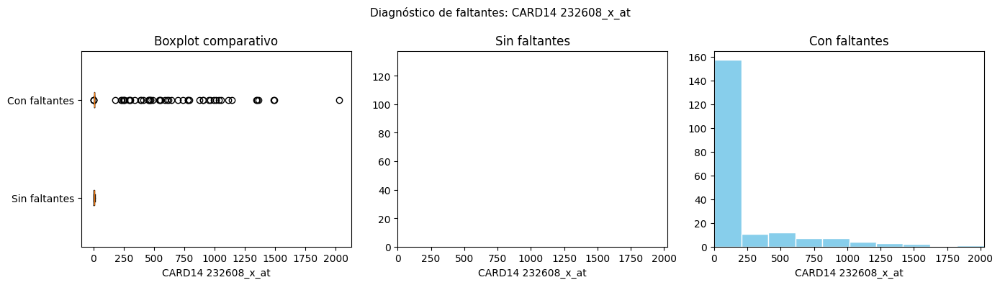

  p-value t-test: 0.0000  →  MAR/MNAR


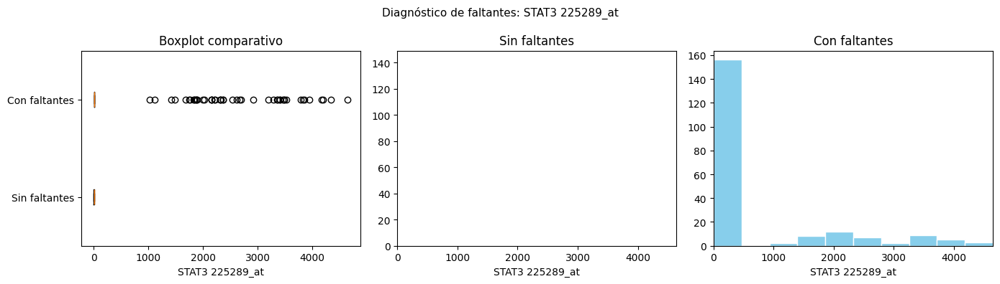

  p-value t-test: 0.0000  →  MAR/MNAR


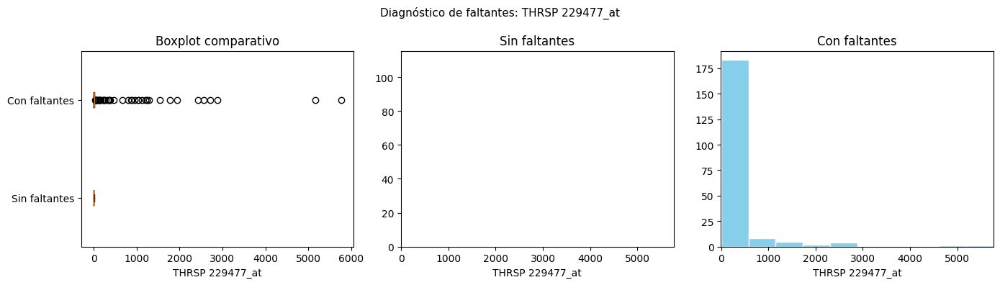

  p-value t-test: 0.0000  →  MAR/MNAR


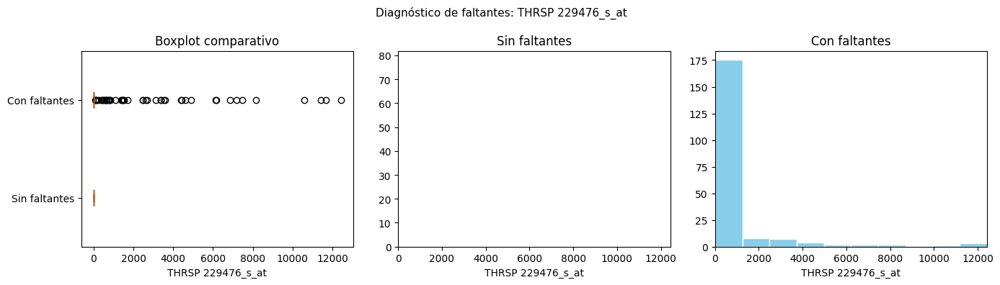

  p-value t-test: 0.0000  →  MAR/MNAR


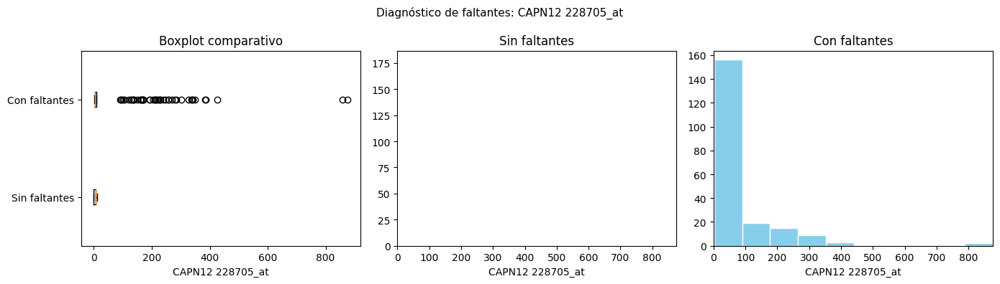

  p-value t-test: 0.0000  →  MAR/MNAR


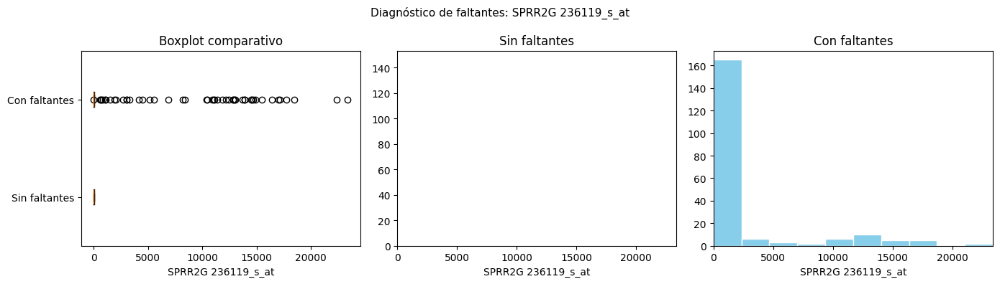

  p-value t-test: 0.0000  →  MAR/MNAR


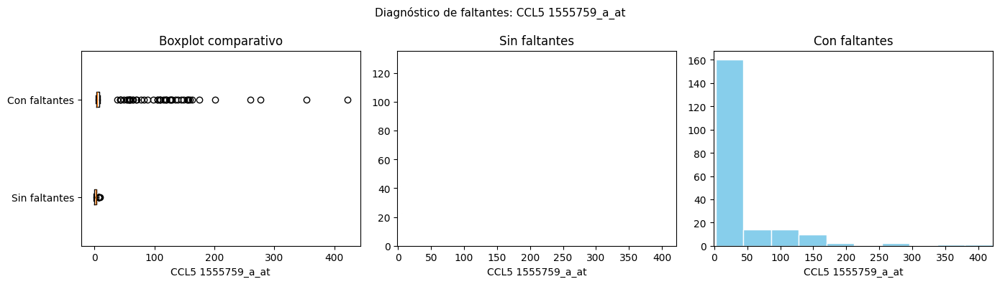

  p-value t-test: 0.0000  →  MAR/MNAR


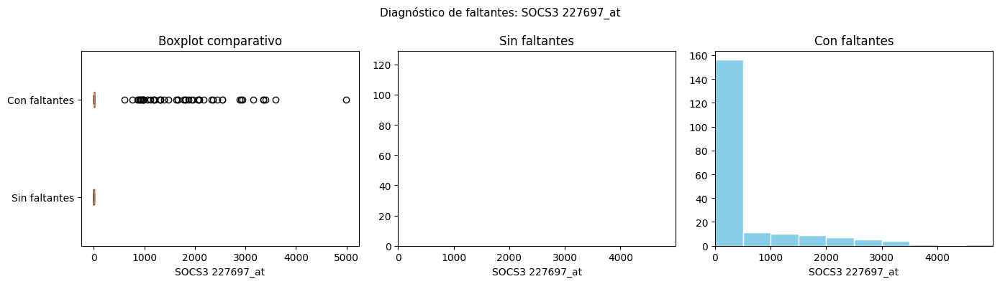

  p-value t-test: 0.0000  →  MAR/MNAR


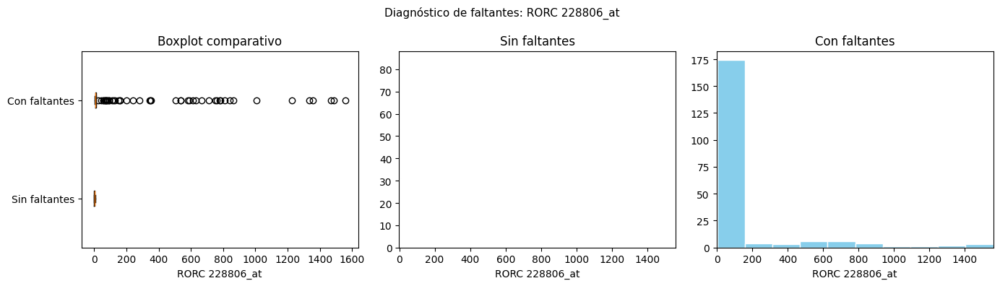

  p-value t-test: 0.0000  →  MAR/MNAR


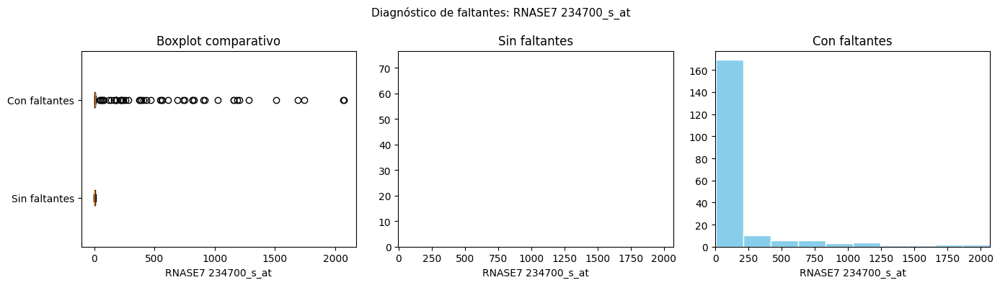

  p-value t-test: 0.0000  →  MAR/MNAR


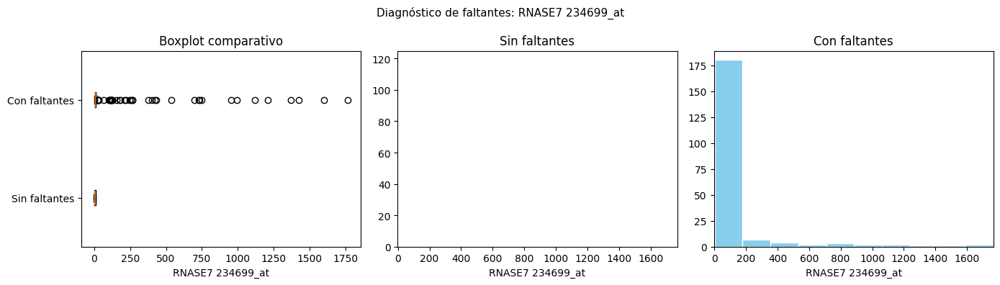

  p-value t-test: 0.0000  →  MAR/MNAR


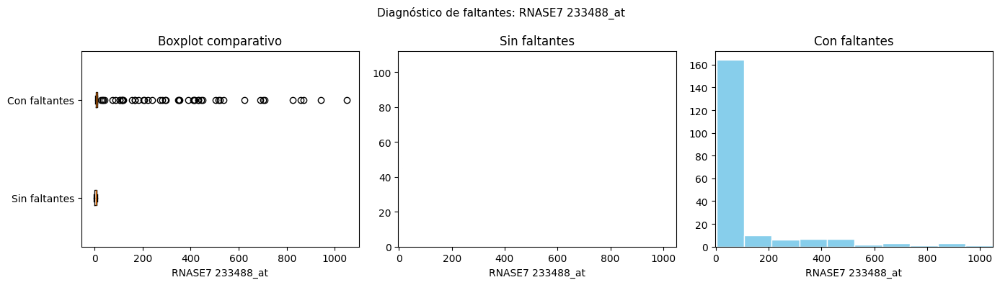

  p-value t-test: 0.0000  →  MAR/MNAR


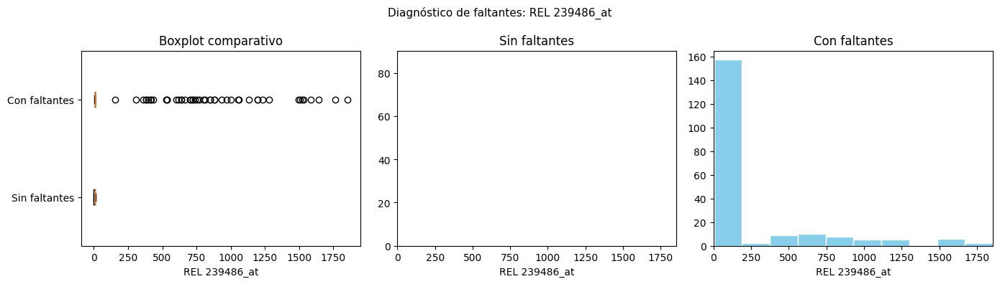

  p-value t-test: 0.0000  →  MAR/MNAR


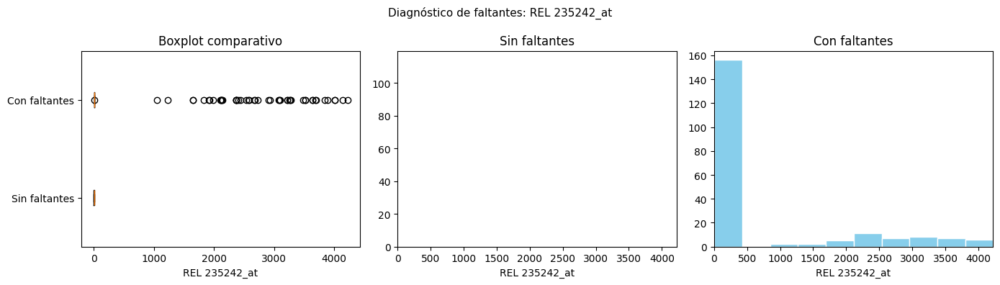

  p-value t-test: 0.0000  →  MAR/MNAR


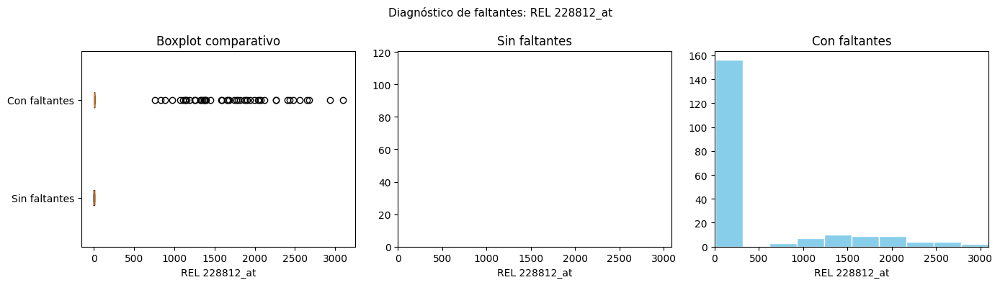

  p-value t-test: 0.0000  →  MAR/MNAR


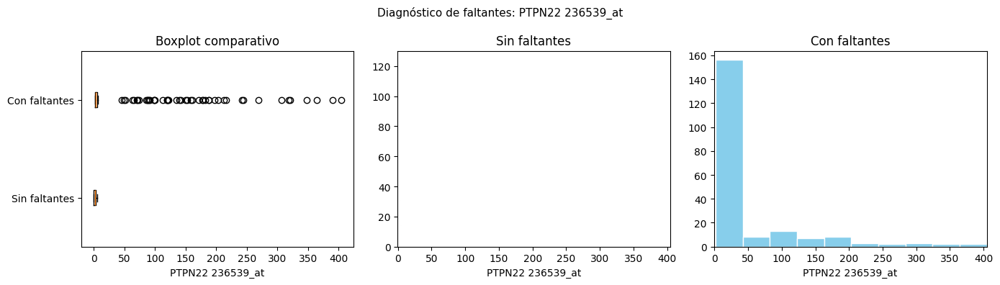

  p-value t-test: 0.0000  →  MAR/MNAR


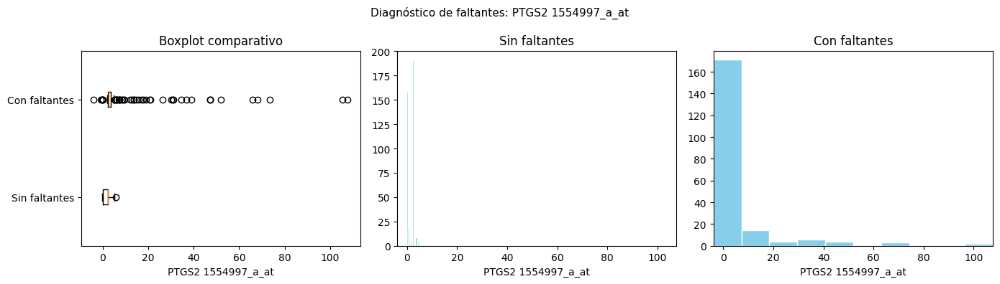

  p-value t-test: 0.0000  →  MAR/MNAR


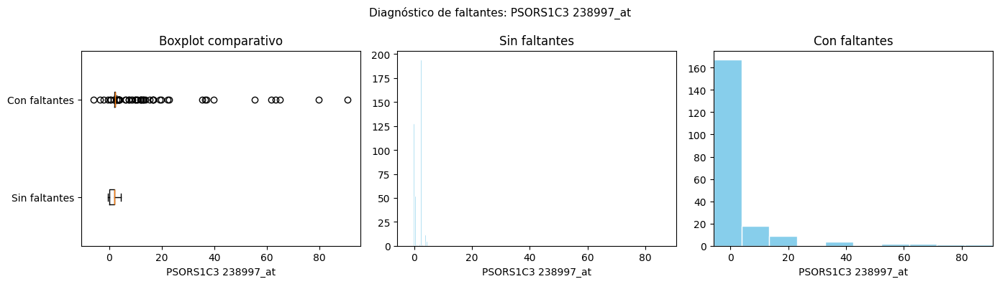

  p-value t-test: 0.0000  →  MAR/MNAR


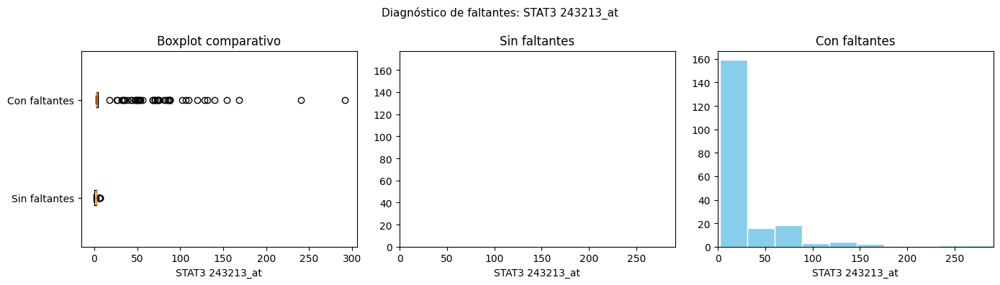

  p-value t-test: 0.0000  →  MAR/MNAR


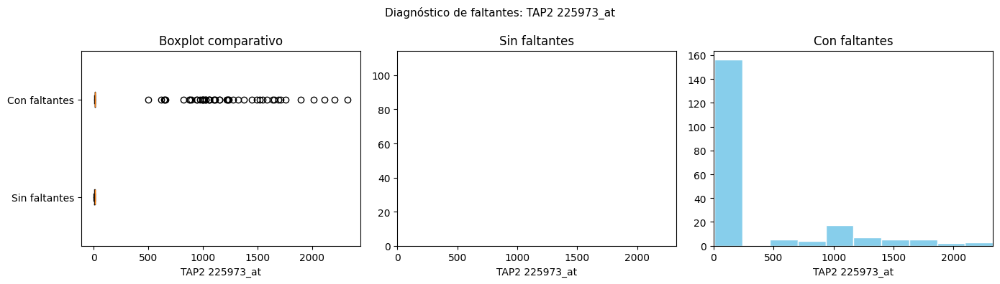

  p-value t-test: 0.0000  →  MAR/MNAR


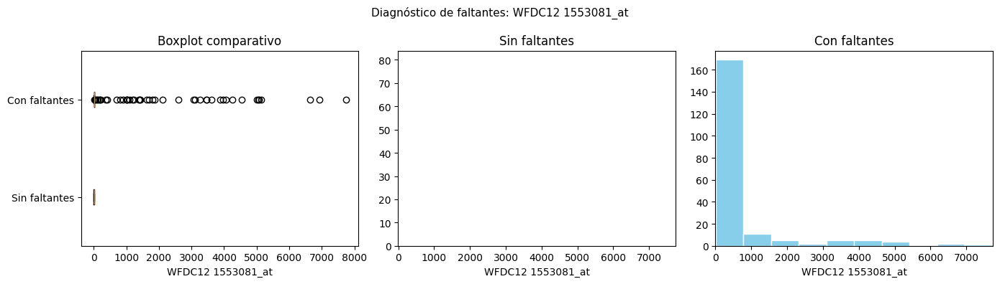

  p-value t-test: 0.0000  →  MAR/MNAR


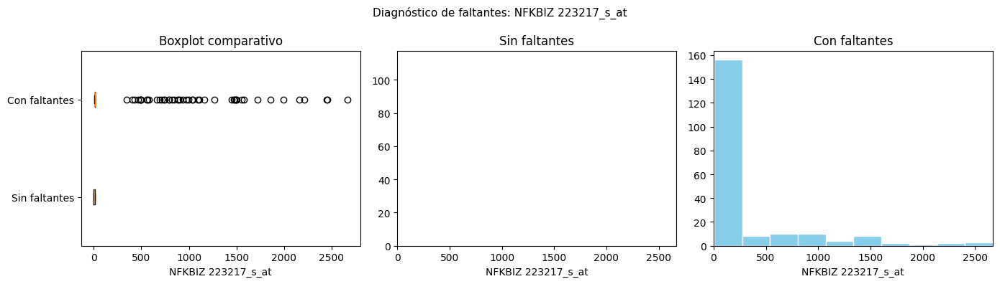

  p-value t-test: 0.0000  →  MAR/MNAR


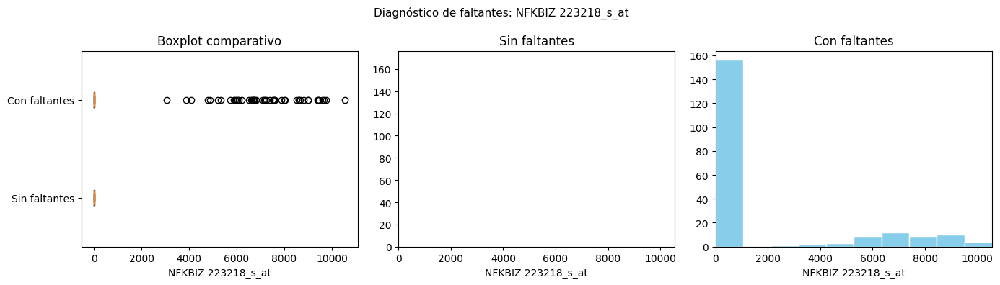

  p-value t-test: 0.0000  →  MAR/MNAR


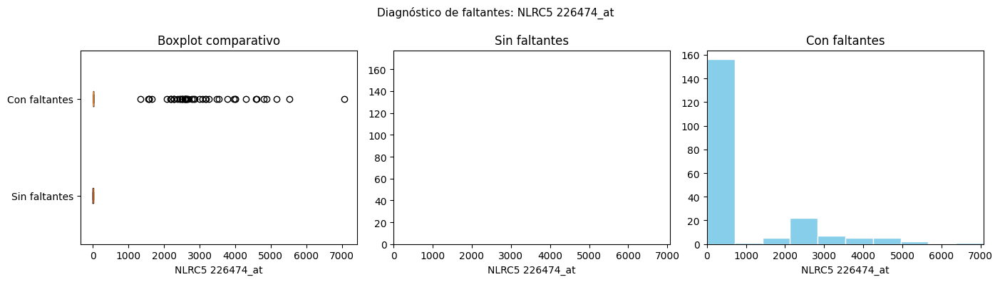

  p-value t-test: 0.0000  →  MAR/MNAR


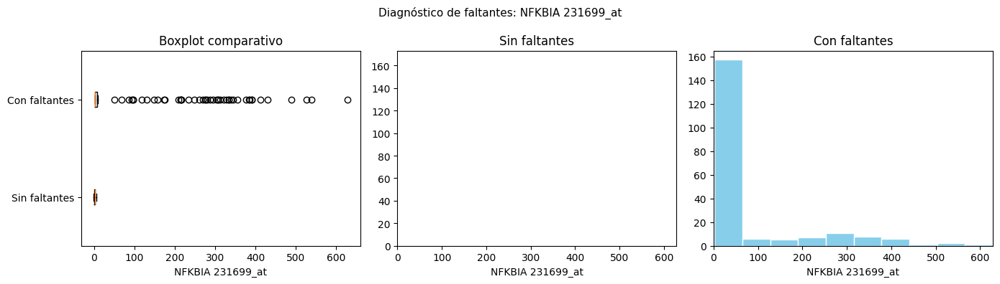

  p-value t-test: 0.0000  →  MAR/MNAR


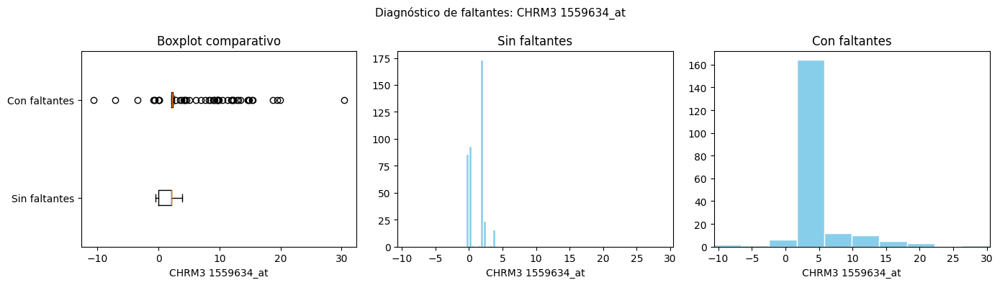

  p-value t-test: 0.0000  →  MAR/MNAR


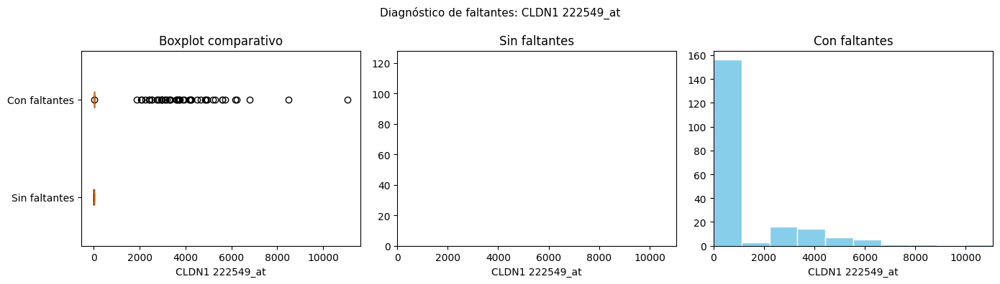

  p-value t-test: 0.0000  →  MAR/MNAR


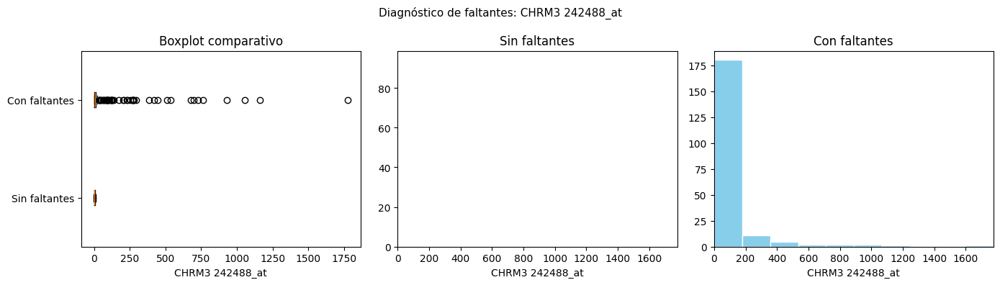

  p-value t-test: 0.0000  →  MAR/MNAR


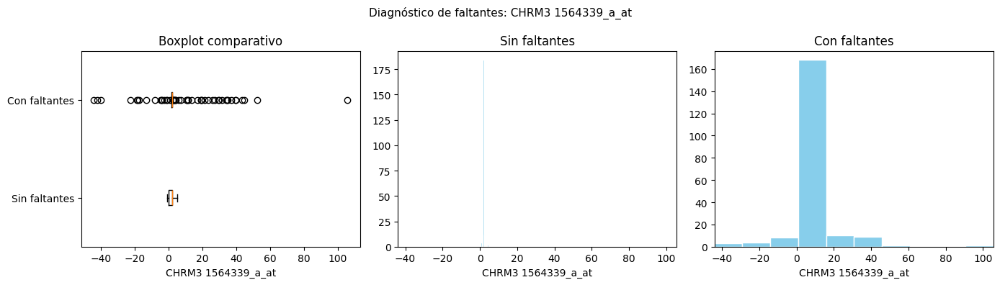

  p-value t-test: 0.0000  →  MAR/MNAR


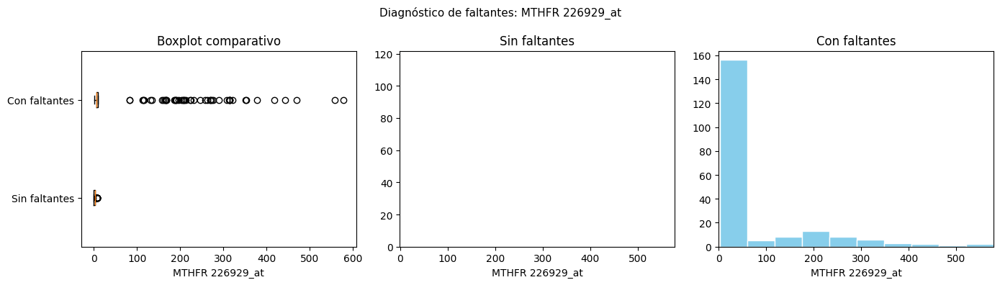

  p-value t-test: 0.0000  →  MAR/MNAR


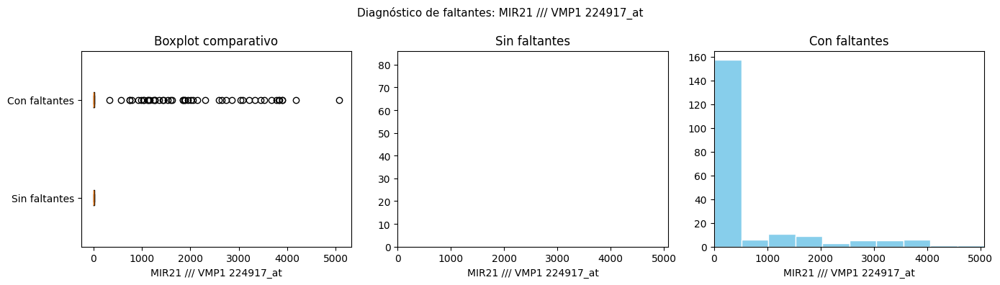

  p-value t-test: 0.0000  →  MAR/MNAR


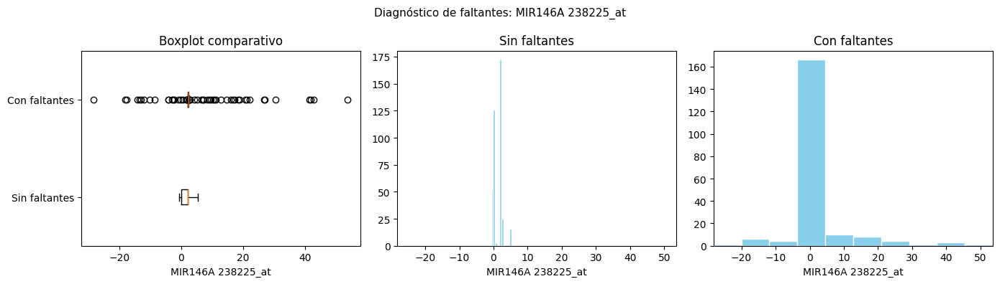

  p-value t-test: 0.0000  →  MAR/MNAR


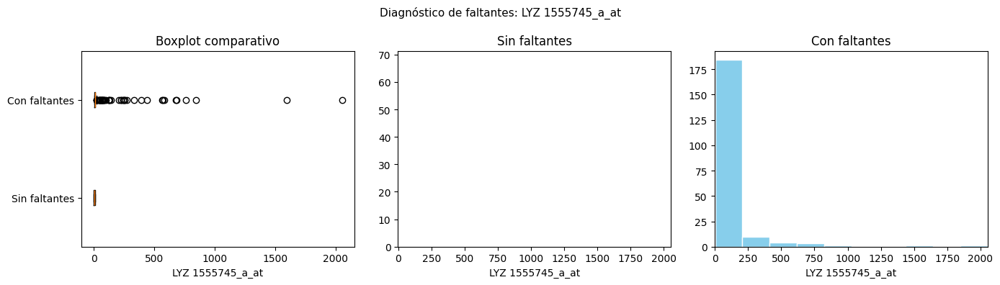

  p-value t-test: 0.0000  →  MAR/MNAR


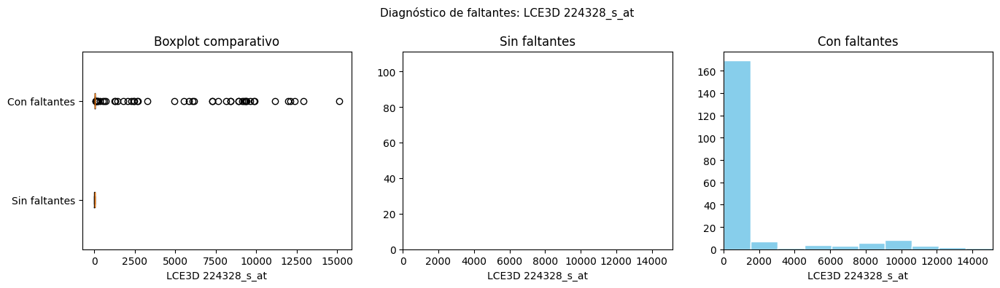

  p-value t-test: 0.0000  →  MAR/MNAR


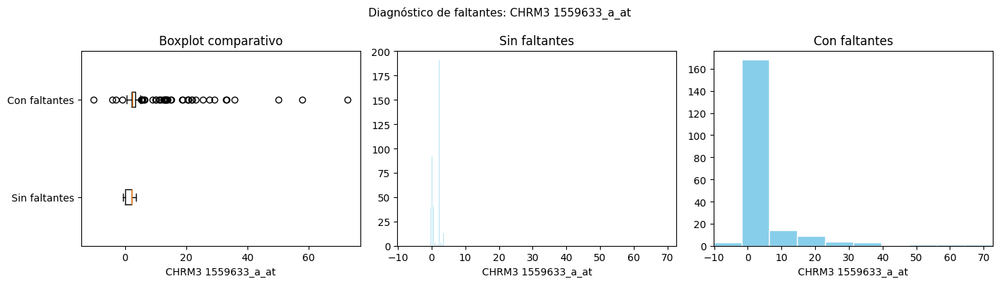

  p-value t-test: 0.0000  →  MAR/MNAR


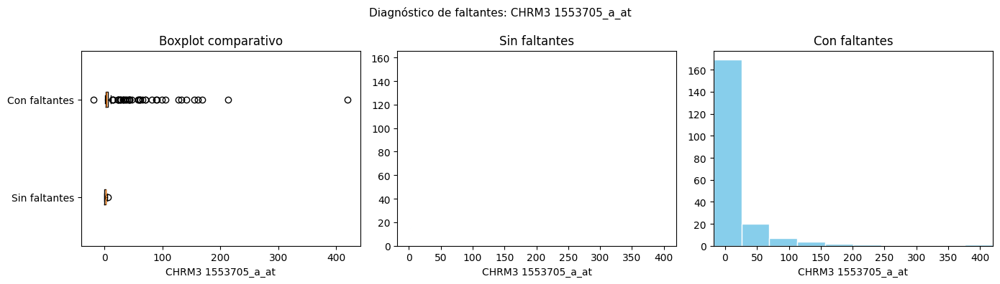

  p-value t-test: 0.0000  →  MAR/MNAR


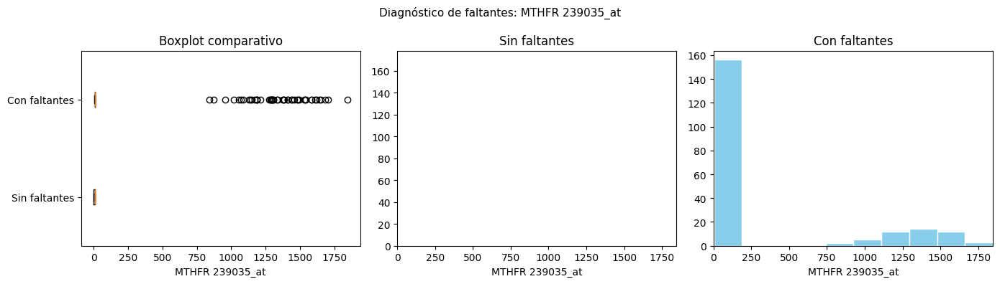

  p-value t-test: 0.0000  →  MAR/MNAR


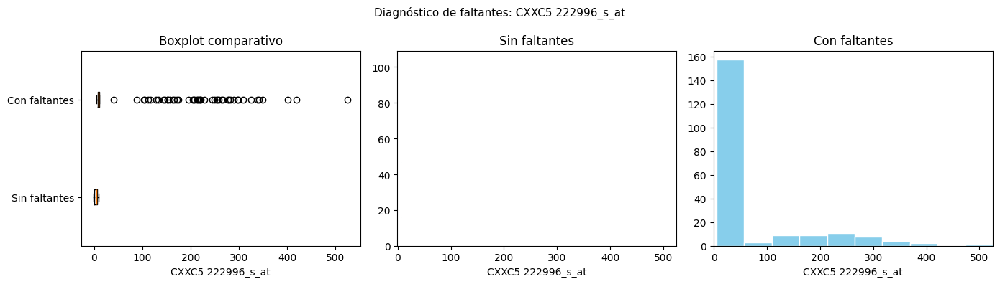

  p-value t-test: 0.0000  →  MAR/MNAR


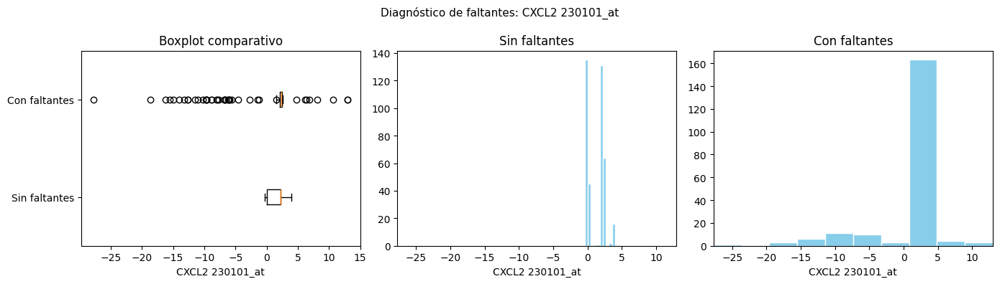

  p-value t-test: 0.0101  →  MAR/MNAR


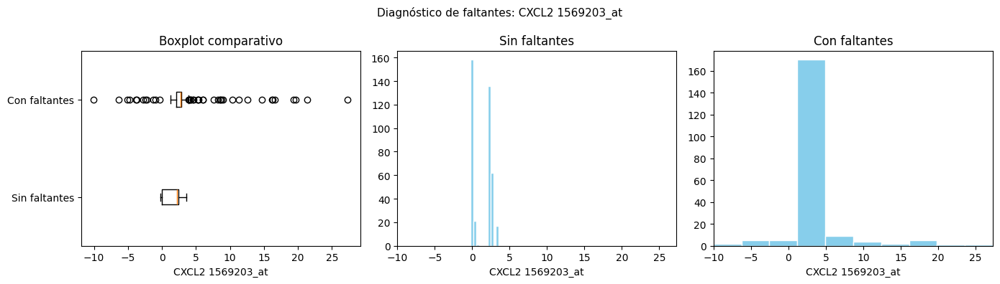

  p-value t-test: 0.0000  →  MAR/MNAR


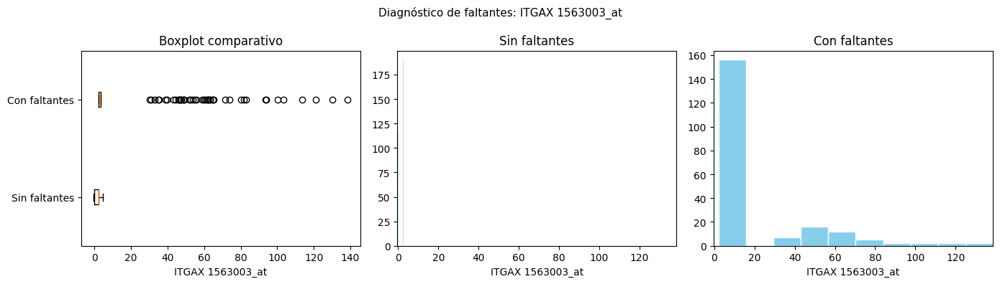

  p-value t-test: 0.0000  →  MAR/MNAR


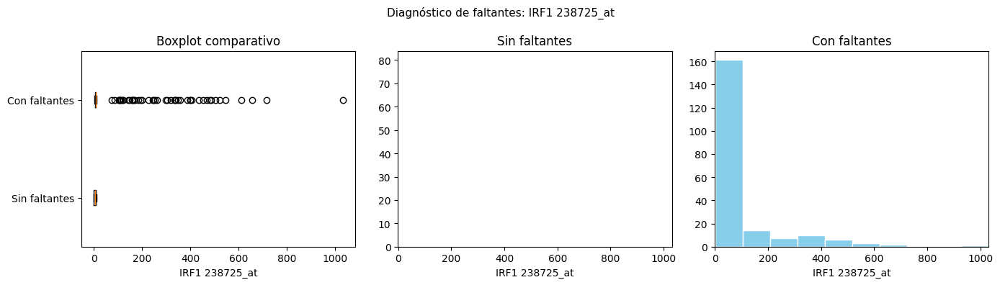

  p-value t-test: 0.0000  →  MAR/MNAR


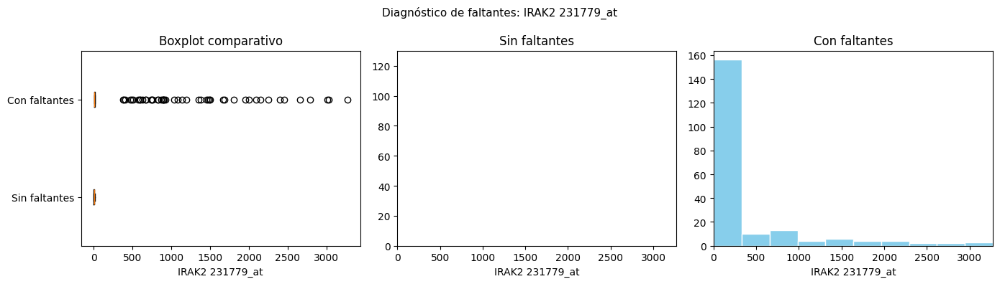

  p-value t-test: 0.0000  →  MAR/MNAR


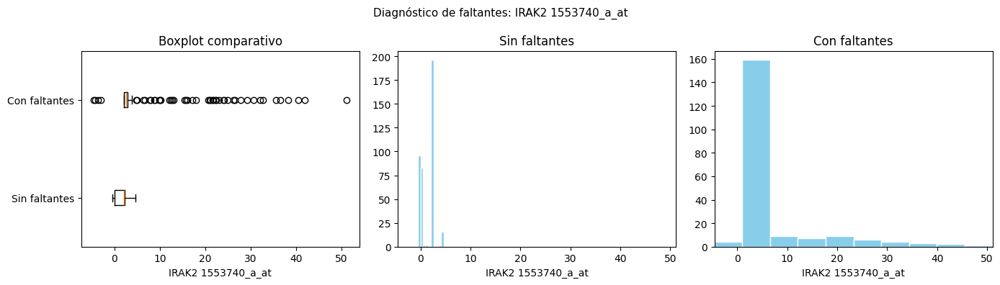

  p-value t-test: 0.0000  →  MAR/MNAR


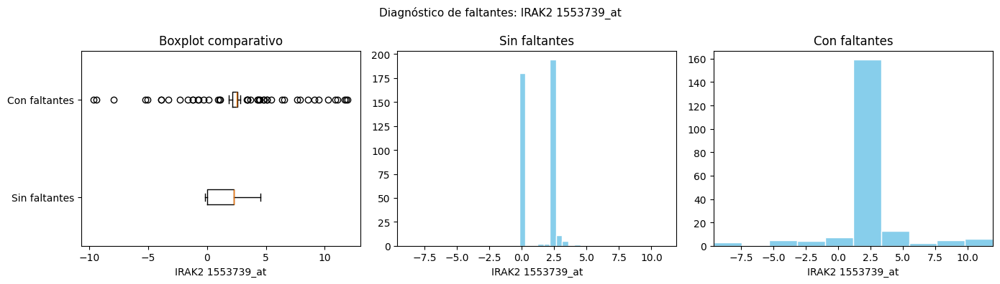

  p-value t-test: 0.0000  →  MAR/MNAR


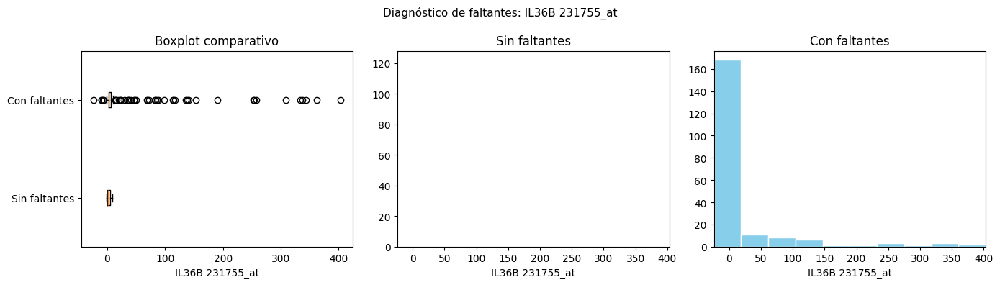

  p-value t-test: 0.0000  →  MAR/MNAR


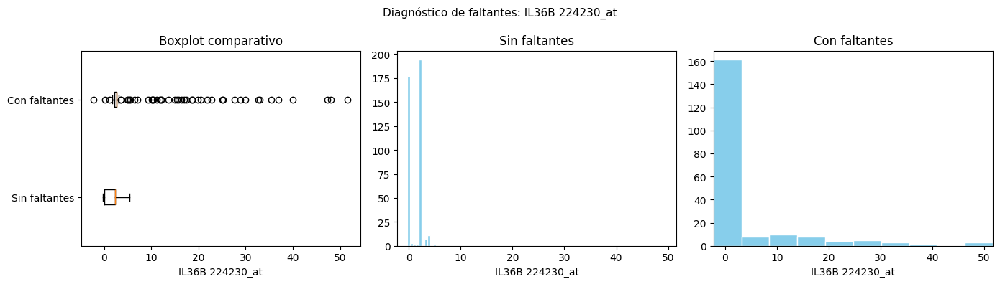

  p-value t-test: 0.0000  →  MAR/MNAR


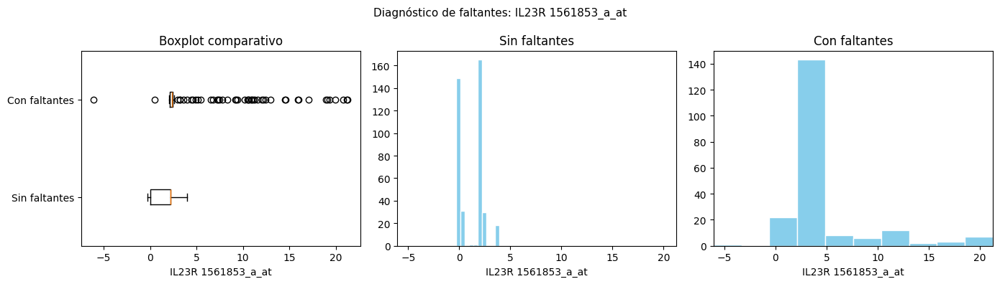

  p-value t-test: 0.0000  →  MAR/MNAR


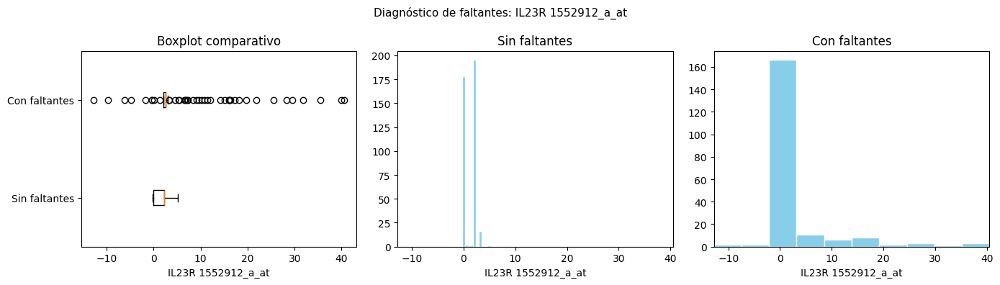

  p-value t-test: 0.0000  →  MAR/MNAR


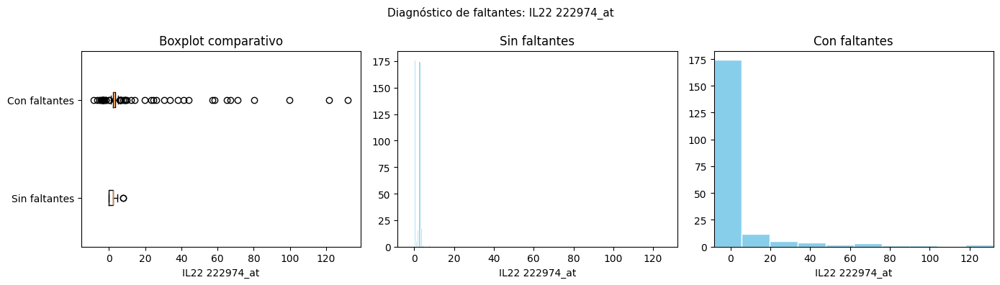

  p-value t-test: 0.0000  →  MAR/MNAR


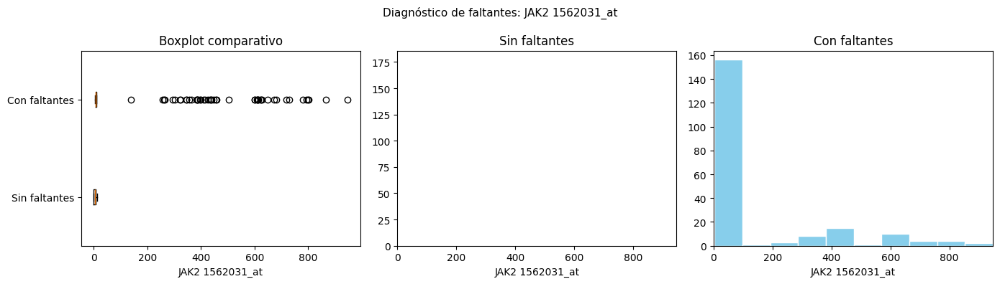

  p-value t-test: 0.0000  →  MAR/MNAR


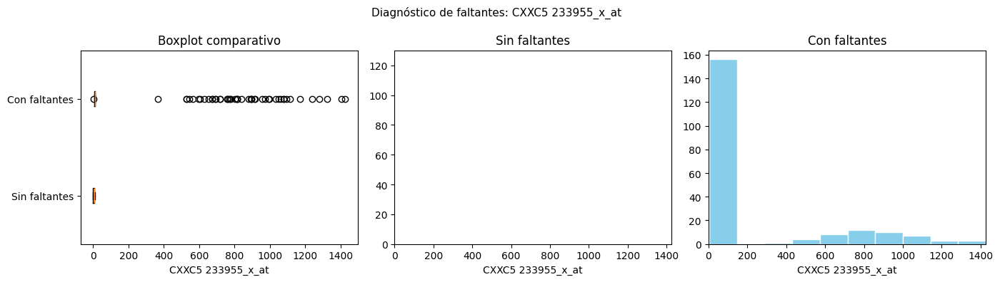

  p-value t-test: 0.0000  →  MAR/MNAR


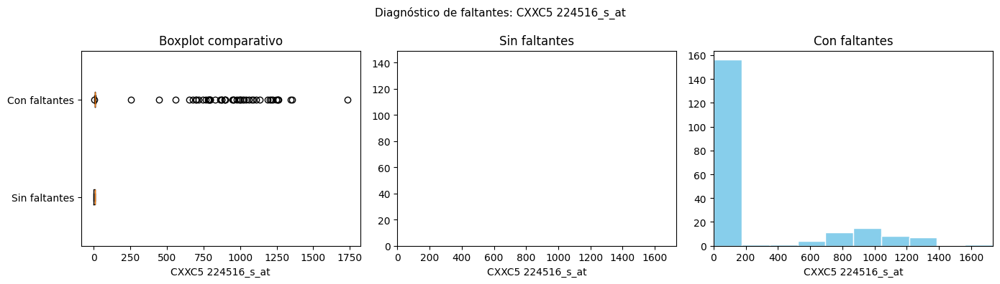

  p-value t-test: 0.0000  →  MAR/MNAR


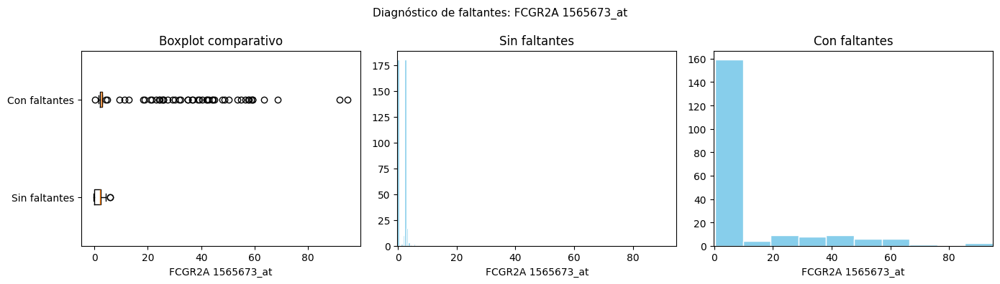

  p-value t-test: 0.0000  →  MAR/MNAR


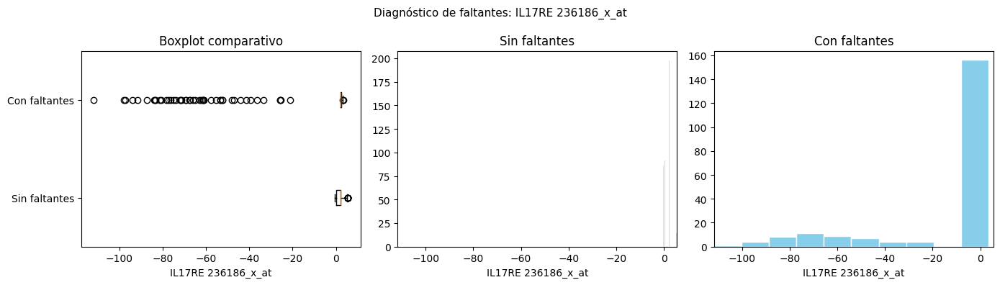

  p-value t-test: 0.0000  →  MAR/MNAR


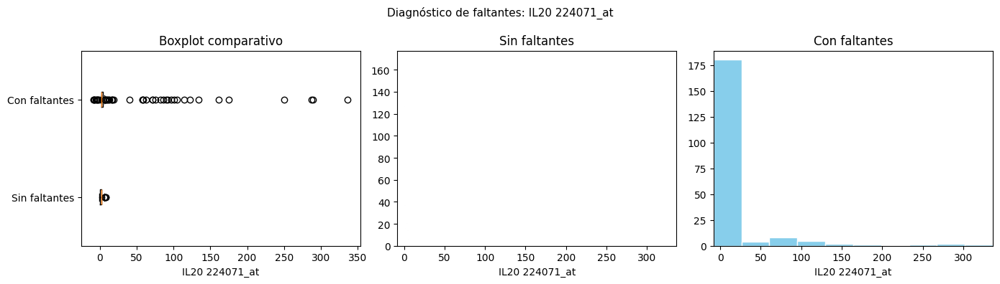

  p-value t-test: 0.0000  →  MAR/MNAR


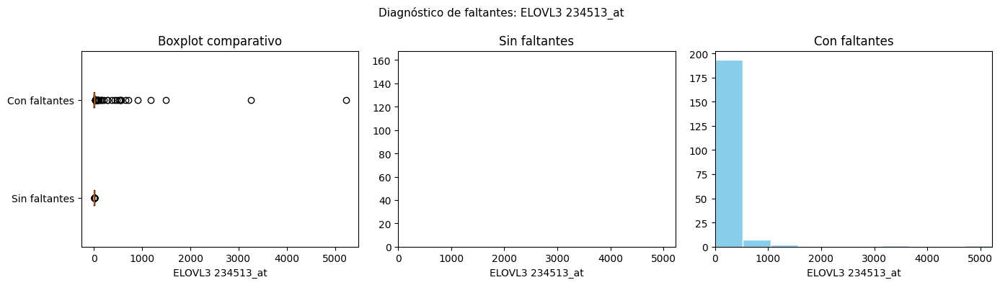

  p-value t-test: 0.0001  →  MAR/MNAR


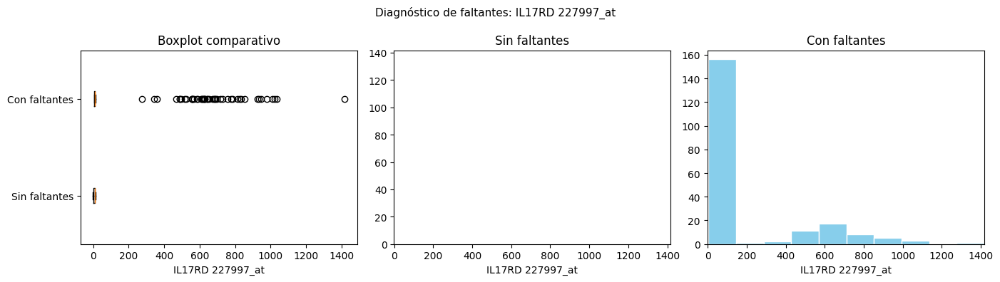

  p-value t-test: 0.0000  →  MAR/MNAR


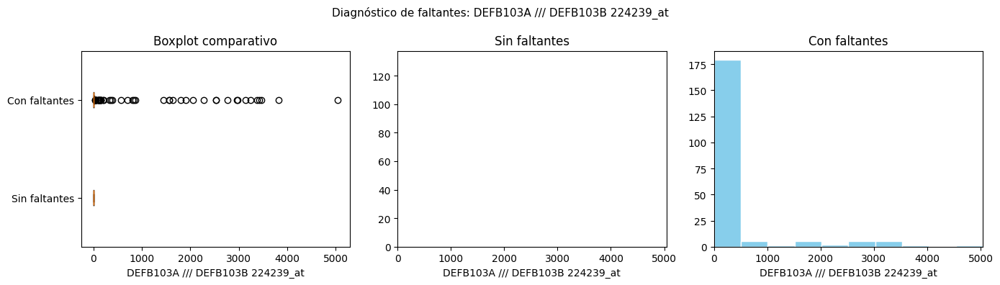

  p-value t-test: 0.0000  →  MAR/MNAR


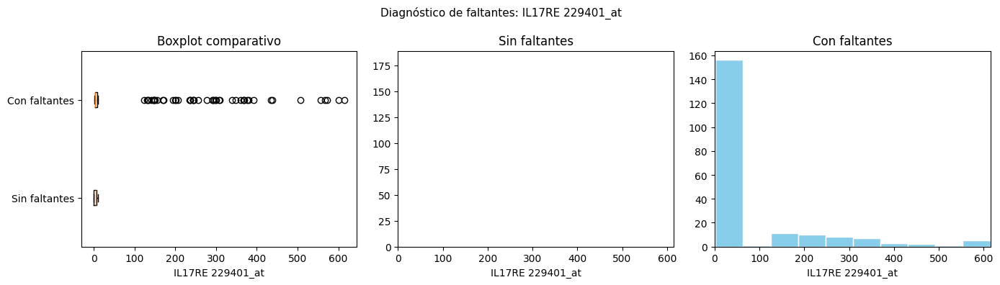

  p-value t-test: 0.0000  →  MAR/MNAR


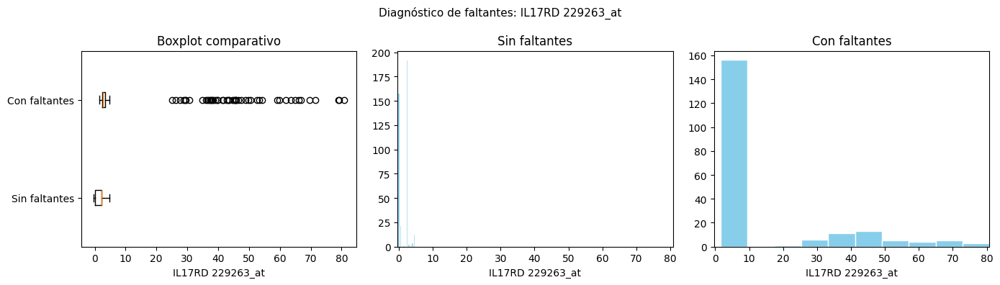

  p-value t-test: 0.0000  →  MAR/MNAR


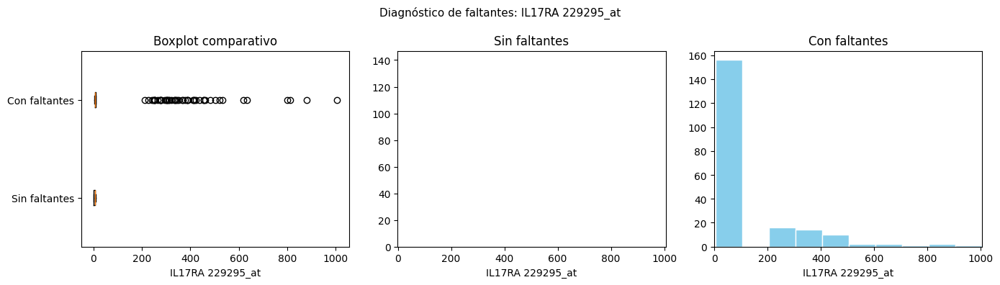

  p-value t-test: 0.0000  →  MAR/MNAR


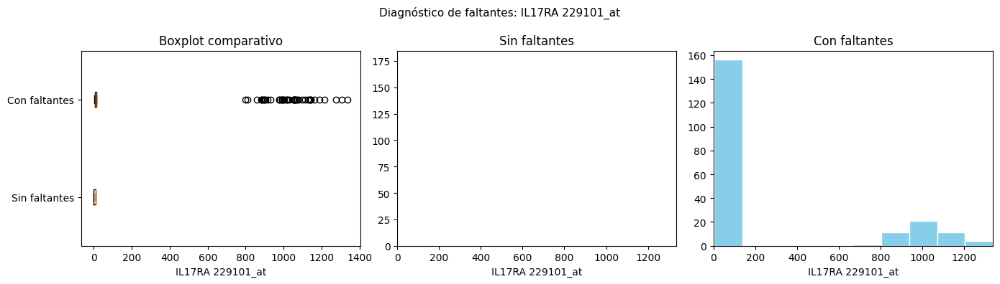

  p-value t-test: 0.0000  →  MAR/MNAR


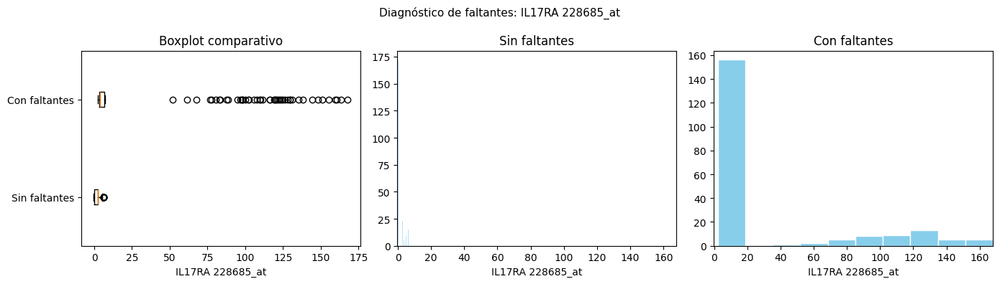

  p-value t-test: 0.0000  →  MAR/MNAR


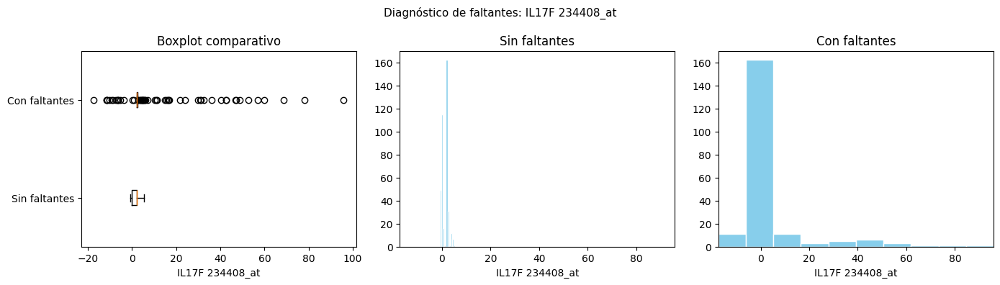

  p-value t-test: 0.0000  →  MAR/MNAR


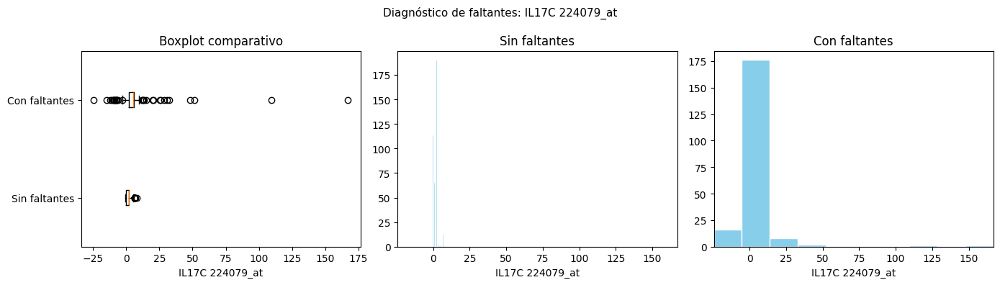

  p-value t-test: 0.0000  →  MAR/MNAR


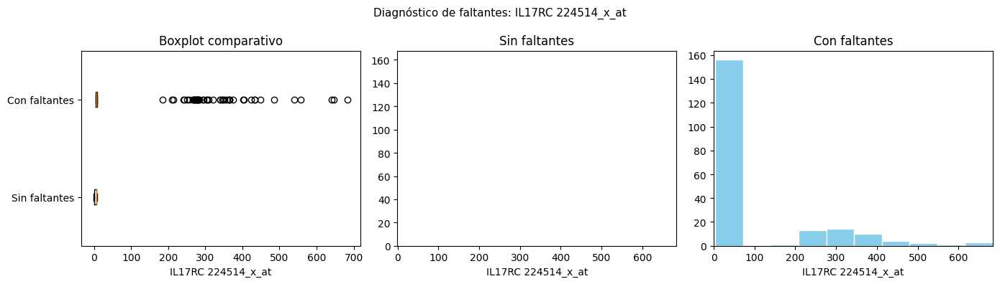

  p-value t-test: 0.0000  →  MAR/MNAR


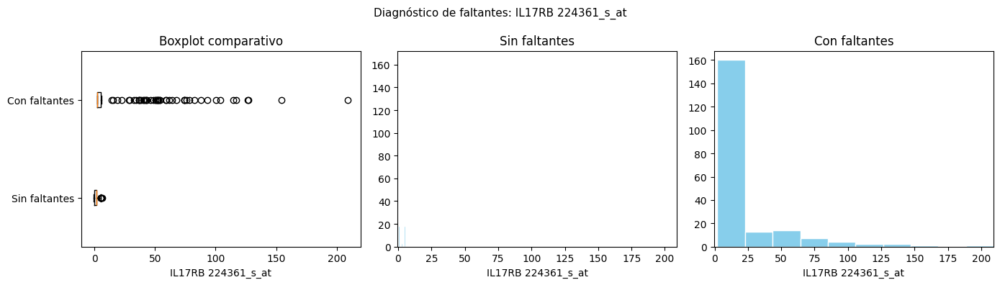

  p-value t-test: 0.0000  →  MAR/MNAR


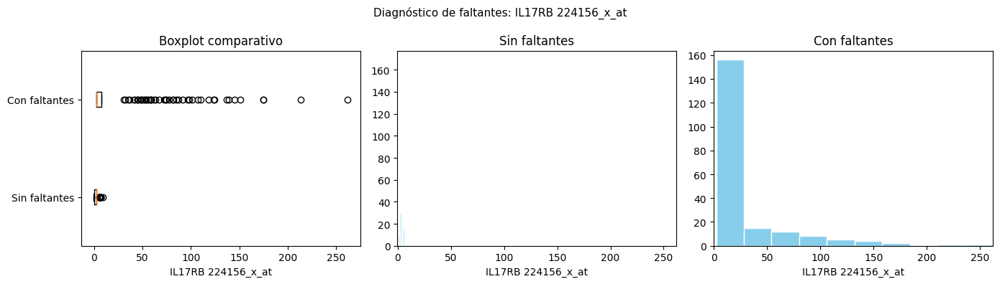

  p-value t-test: 0.0000  →  MAR/MNAR


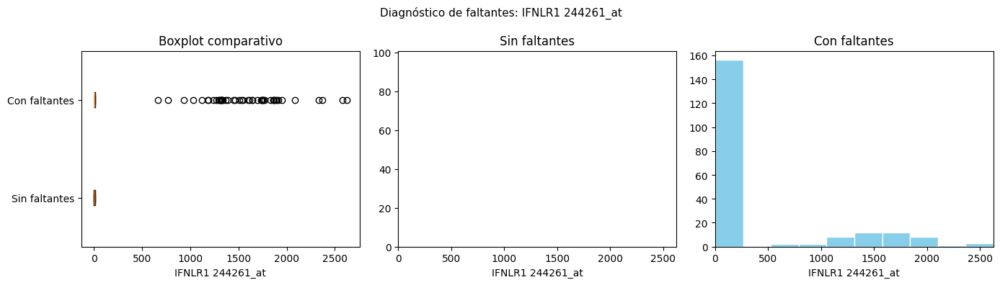

  p-value t-test: 0.0000  →  MAR/MNAR


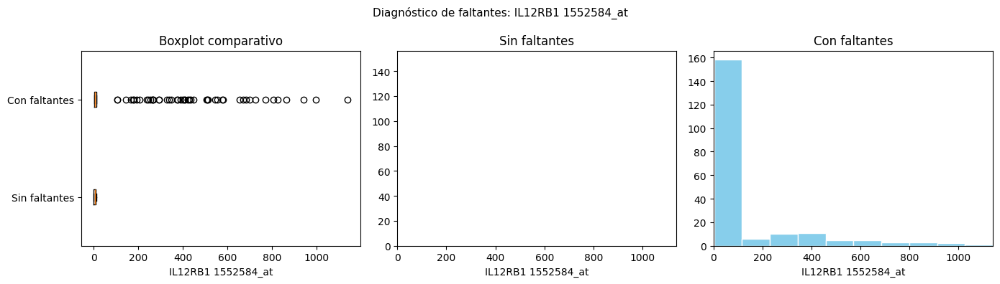

  p-value t-test: 0.0000  →  MAR/MNAR


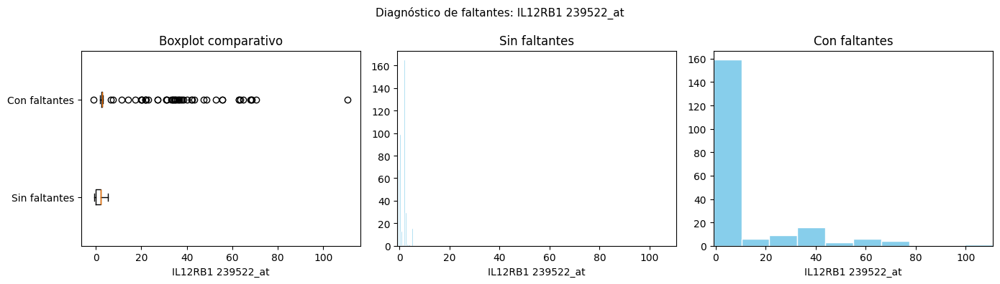

  p-value t-test: 0.0000  →  MAR/MNAR


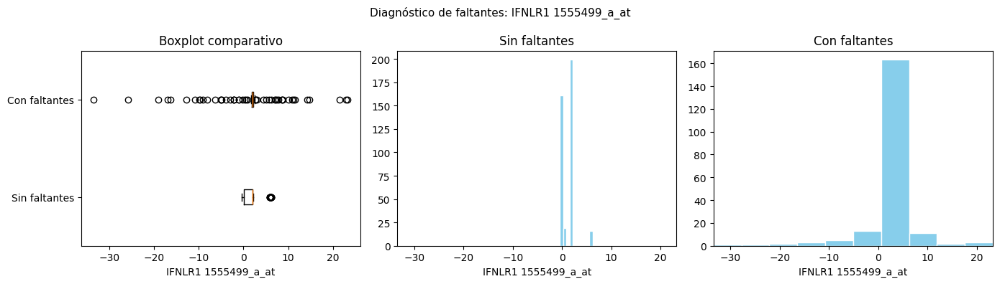

  p-value t-test: 0.2370  →  MCAR


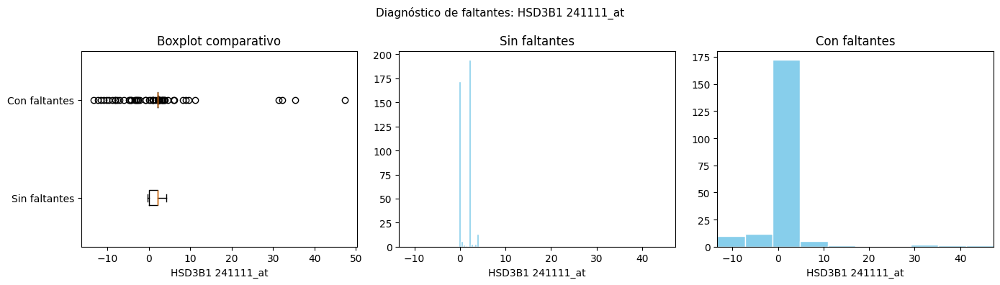

  p-value t-test: 0.0102  →  MAR/MNAR


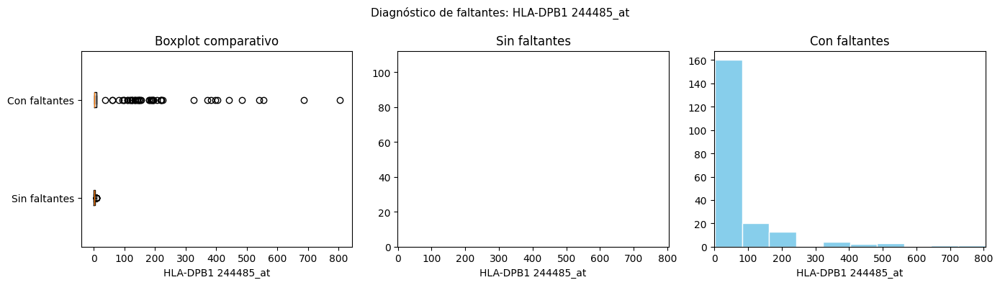

  p-value t-test: 0.0000  →  MAR/MNAR


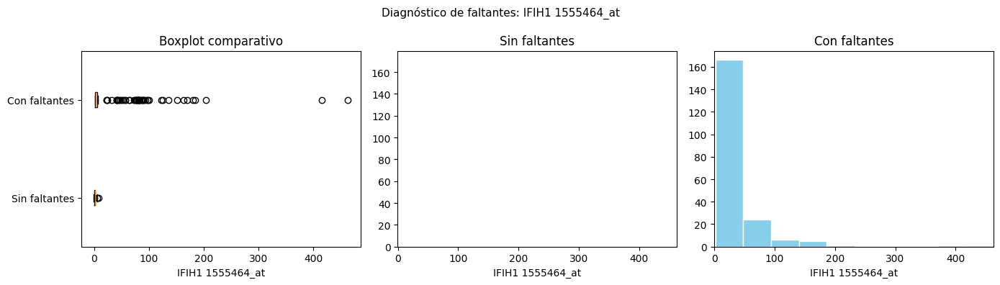

  p-value t-test: 0.0000  →  MAR/MNAR


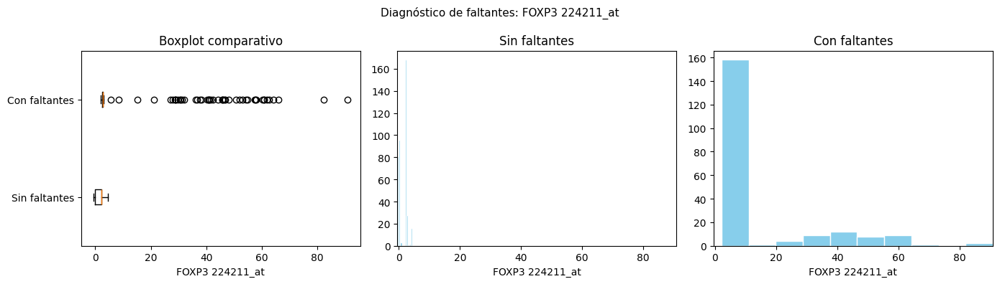

  p-value t-test: 0.0000  →  MAR/MNAR


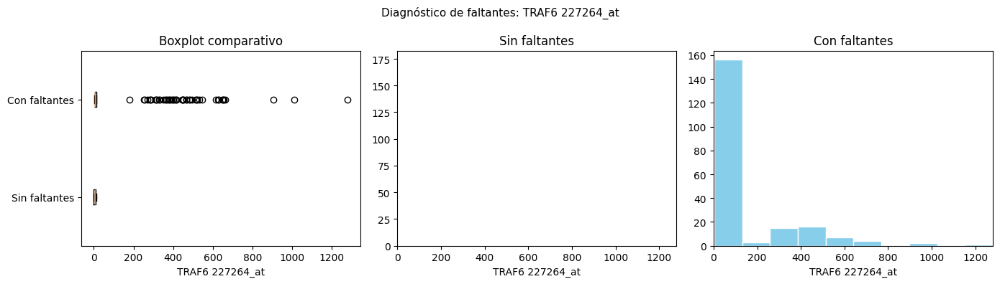

  p-value t-test: 0.0000  →  MAR/MNAR


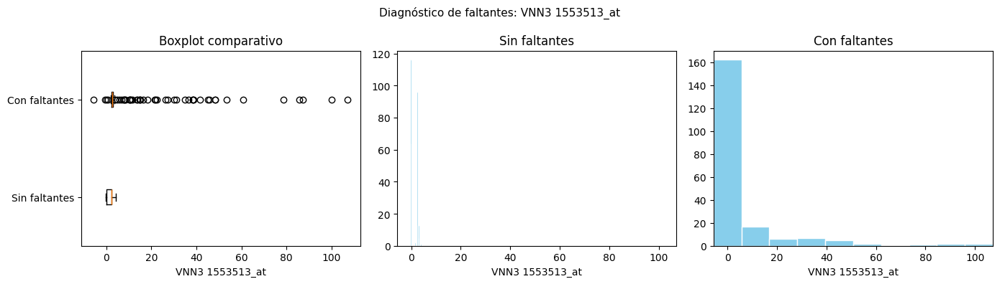

  p-value t-test: 0.0000  →  MAR/MNAR


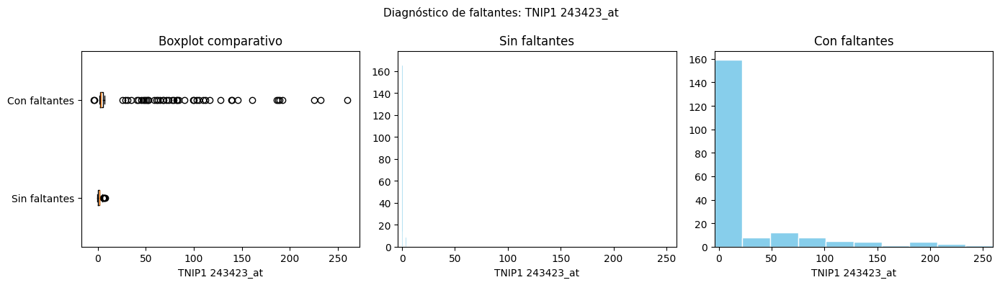

  p-value t-test: 0.0000  →  MAR/MNAR


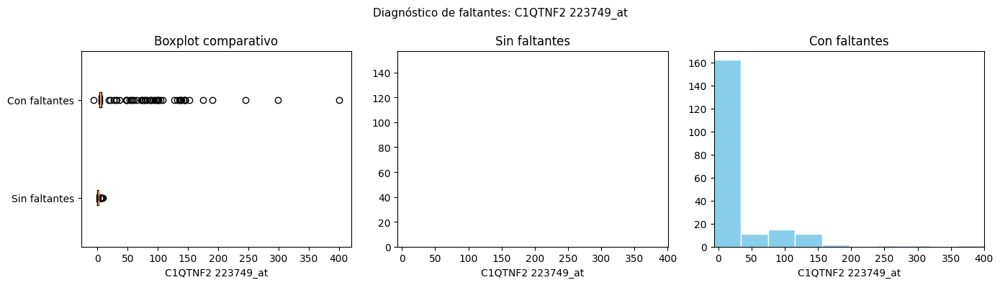

  p-value t-test: 0.0000  →  MAR/MNAR


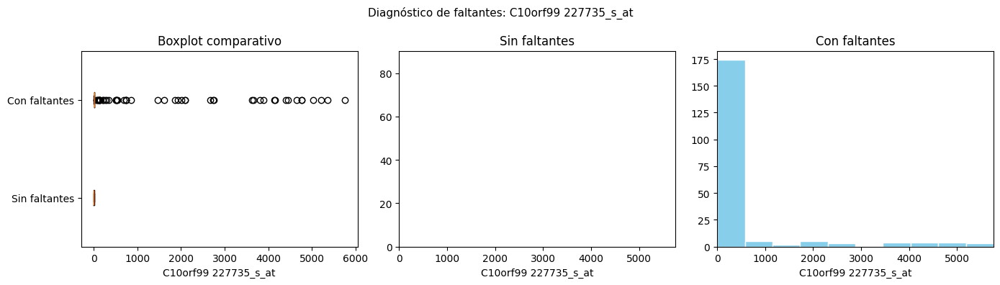

  p-value t-test: 0.0000  →  MAR/MNAR


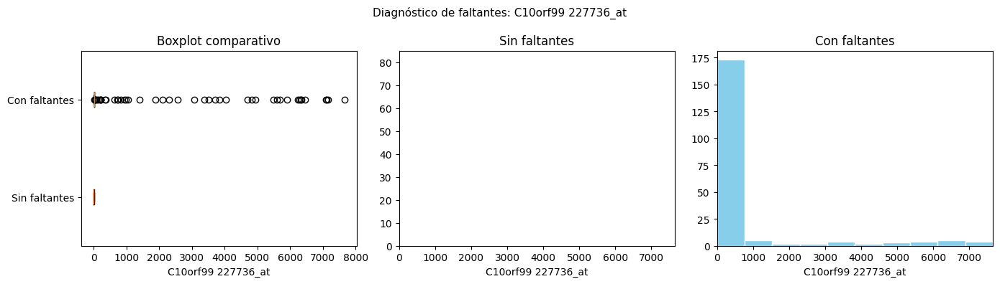

  p-value t-test: 0.0000  →  MAR/MNAR


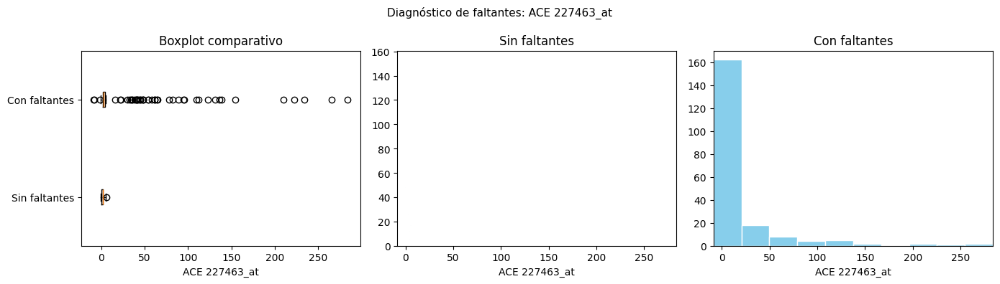

  p-value t-test: 0.0000  →  MAR/MNAR


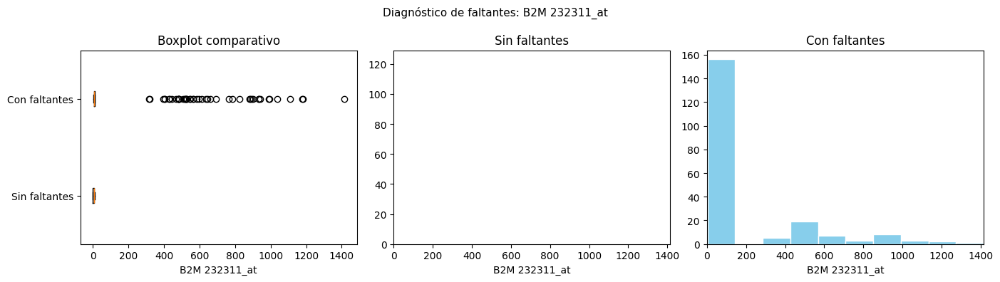

  p-value t-test: 0.0000  →  MAR/MNAR


In [ ]:
# Variables con faltantes que no superaron el umbral y aún están en el DataFrame
cols_a_imputar_mv = [c for c in cols_a_imputar_mv if c in df.columns and df[c].isnull().any()]

# Separar categóricas y numéricas dentro de las que se van a imputar
cols_imputar_cat = [c for c in cols_a_imputar_mv if c in COLS_CATEGORICAS]
cols_imputar_num = [c for c in cols_a_imputar_mv if c in COLS_NUMERICAS]

print(f'Variables a imputar (categóricas): {cols_imputar_cat}')
print(f'Variables a imputar (numéricas):   {cols_imputar_num}')

# Diagnóstico de categóricas usando la variable objetivo como referencia
if cols_imputar_cat:
    print('\n--- Diagnóstico categóricas ---')
    mascara = df[VAR_OBJETIVO].isnull()   # Referencia: faltantes en variable objetivo
    for col in cols_imputar_cat:
        mascara = df[col].isnull()
        print(f'\nVariable diagnóstico base: {col}')
        for otra in cols_imputar_cat:
            if otra != col:
                diagnosticar_faltantes_categorica(df, otra, mascara)

# Diagnóstico de numéricas
if cols_imputar_num:
    print('\n--- Diagnóstico numéricas ---')
    # Se usa la primera categórica con faltantes como máscara, si existe
    mascara_ref = df[cols_imputar_cat[0]].isnull() if cols_imputar_cat else df[cols_imputar_num[0]].isnull()
    for col in cols_imputar_num:
        diagnosticar_faltantes_numerica(df, col, mascara_ref)

### 4.3 Mapa de Calor de Valores Faltantes

Se visualiza el patrón espacial de los valores faltantes en las variables numéricas que serán imputadas.

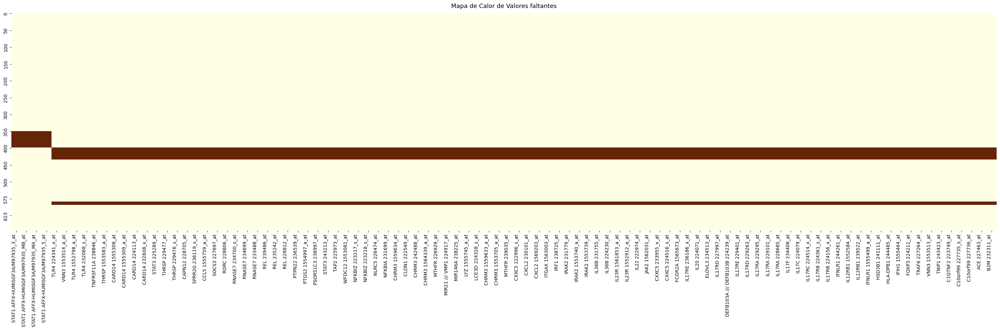

In [ ]:
# Fondo blanco limpio
fig, ax = plt.subplots(figsize=(30, 10))
#fig, ax = plt.subplots(figsize=(14, 7))

sns.heatmap(
    df[cols_imputar_num].isnull(),
    cmap="YlOrBr", # blanco=presente, naranja/café=faltante
    cbar=False,
    yticklabels=50, # un tick cada 50 filas
    xticklabels=True,
    ax=ax
)

# Fondo blanco explícito
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

ax.set_title("Mapa de Calor de Valores faltantes", fontsize=13, pad=12)
ax.tick_params(axis='x', rotation=45)

plt.xticks(rotation=90, ha='right')

plt.tight_layout()
plt.savefig("mapa_calor_missings_v2.png", dpi=150, bbox_inches="tight")
plt.show()

In [ ]:
# Identificar renglones (filas) con valores faltantes
faltantes_por_renglon = df.isnull().sum(axis=1)

# Mostrar estadísticas generales
print('='*80)
print('ANÁLISIS DE VALORES FALTANTES POR RENGLÓN (FILA)')
print('='*80)
print(f'\nEstadísticas de faltantes por renglón:')
print(f'  Máximo de faltantes en un renglón: {faltantes_por_renglon.max()}')
print(f'  Mínimo de faltantes en un renglón: {faltantes_por_renglon.min()}')
print(f'  Promedio de faltantes por renglón: {faltantes_por_renglon.mean():.2f}')
print(f'  Mediana de faltantes por renglón: {faltantes_por_renglon.median():.0f}')

# Renglones sin faltantes
renglones_completos = (faltantes_por_renglon == 0).sum()
print(f'\n✓ Renglones sin valores faltantes: {renglones_completos} de {df.shape[0]} ({renglones_completos/df.shape[0]*100:.1f}%)')

# Mostrar TODOS los renglones con valores faltantes
print(f'\n TOP 100 RENGLONES CON MÁS VALORES FALTANTES:')
print('='*80)
print(f'{"Renglón":>10} | {"Valores Faltantes":>20}')
print('-'*80)

# Ordenar por número de faltantes (descendente)
faltantes_ordenados = faltantes_por_renglon.sort_values(ascending=False)

# Mostrar solo renglones que tienen al menos un valor faltante
renglones_con_faltantes = faltantes_ordenados[faltantes_ordenados > 0]

# Seleccionar los top 100 renglones con más valores faltantes
top_100 = renglones_con_faltantes.head(100)

for idx, num_faltantes in top_100.items():
    print(f'{idx:>10} | {num_faltantes:>20}')

print('-'*80)
print(f'Mostrando: Top 100 de {len(renglones_con_faltantes)} renglones con faltantes')
print(f'Total de renglones en el dataset: {df.shape[0]}')

ANÁLISIS DE VALORES FALTANTES POR RENGLÓN (FILA)

Estadísticas de faltantes por renglón:
  Máximo de faltantes en un renglón: 96
  Mínimo de faltantes en un renglón: 0
  Promedio de faltantes por renglón: 7.73
  Mediana de faltantes por renglón: 1

✓ Renglones sin valores faltantes: 315 de 645 (48.8%)

 TOP 100 RENGLONES CON MÁS VALORES FALTANTES:
   Renglón |    Valores Faltantes
--------------------------------------------------------------------------------
       400 |                   96
       401 |                   96
       402 |                   96
       403 |                   96
       406 |                   96
       407 |                   96
       398 |                   96
       399 |                   96
       404 |                   96
       405 |                   96
       417 |                   96
       416 |                   96
       415 |                   96
       414 |                   96
       422 |                   96
       423 |             

In [ ]:
# ============================================================================
# FILTRADO DE RENGLONES CON EXCESO DE VALORES FALTANTES
# ============================================================================

# Parámetro configurable: umbral de valores faltantes
UMBRAL_FALTANTES = 10  # Descartar renglones con más de este número de valores faltantes

# Guardar el dataframe original para comparación
df_original = df.copy()
filas_originales = df.shape[0]

# Calcular valores faltantes por renglón
faltantes_por_renglon = df.isnull().sum(axis=1)

# Identificar renglones a descartar
renglones_a_descartar = faltantes_por_renglon > UMBRAL_FALTANTES
indices_descartados = df[renglones_a_descartar].index.tolist()

# Aplicar el filtrado
df = df[~renglones_a_descartar]

# Resetear el índice para mantener continuidad
df = df.reset_index(drop=True)

# Reporte del filtrado
print('='*80)
print('REPORTE DE FILTRADO DE RENGLONES')
print('='*80)
print(f'\n⚙️  Umbral configurado: Descartar renglones con más de {UMBRAL_FALTANTES} valores faltantes')
print(f'\n📊 Resultados:')
print(f'   • Renglones originales:    {filas_originales:,}')
print(f'   • Renglones descartados:   {len(indices_descartados):,}  ({len(indices_descartados)/filas_originales*100:.2f}%)')
print(f'   • Renglones conservados:   {df.shape[0]:,}  ({df.shape[0]/filas_originales*100:.2f}%)')


REPORTE DE FILTRADO DE RENGLONES

⚙️  Umbral configurado: Descartar renglones con más de 10 valores faltantes

📊 Resultados:
   • Renglones originales:    645
   • Renglones descartados:   46  (7.13%)
   • Renglones conservados:   599  (92.87%)


**Mapa de Calor Después del Filtrado**

Visualización de los valores faltantes después de eliminar los renglones con exceso de datos faltantes.

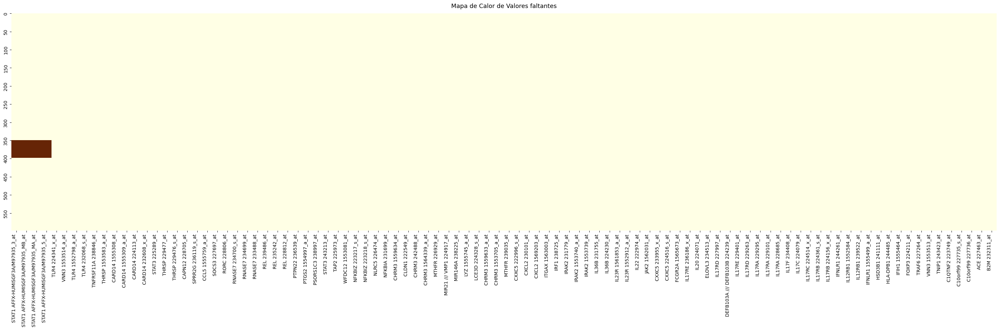

In [ ]:
# Fondo blanco limpio
fig, ax = plt.subplots(figsize=(30, 10))
#fig, ax = plt.subplots(figsize=(14, 7))

sns.heatmap(
    df[cols_imputar_num].isnull(),
    cmap="YlOrBr", # blanco=presente, naranja/café=faltante
    cbar=False,
    yticklabels=50, # un tick cada 50 filas
    xticklabels=True,
    ax=ax
)

# Fondo blanco explícito
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

ax.set_title("Mapa de Calor de Valores faltantes", fontsize=13, pad=12)
ax.tick_params(axis='x', rotation=45)

plt.xticks(rotation=90, ha='right')

plt.tight_layout()
plt.savefig("mapa_calor_missings_v2.png", dpi=150, bbox_inches="tight")
plt.show()

### 4.4 Imputación con Mediana

Dado que el conjunto integra datos de múltiples estudios clínicos con protocolos distintos, se asume mecanismo **MAR** (*Missing At Random*). Se utiliza la **mediana** para todas las variables (categóricas → moda; numéricas → mediana), ya que la media y la mediana convergen cuando la distribución es aproximadamente simétrica y la mediana es más robusta ante asimetrías.

In [ ]:
import numpy as np

# Imputar categóricas con moda
if cols_imputar_cat:
    for col in cols_imputar_cat:
        moda = df[col].mode()
        if len(moda) > 0:
            df[col]= df[col].fillna(moda[0])
    print(f'Categóricas imputadas con moda: {cols_imputar_cat}')

# Imputar numéricas con mediana
if cols_imputar_num:
    for col in cols_imputar_num:
        mediana = df[col].median()
        df[col]= df[col].fillna(mediana)
    print(f'Numéricas imputadas con mediana: {len(cols_imputar_num)} columnas')

# Verificación: no deben quedar faltantes en las columnas imputadas
faltantes_restantes = df[cols_a_imputar_mv].isnull().sum()
faltantes_restantes = faltantes_restantes[faltantes_restantes > 0]
if faltantes_restantes.empty:
    print('\n✓ Sin valores faltantes en las columnas imputadas.')
else:
    print(f'\n⚠ Faltantes restantes: {faltantes_restantes}')

Categóricas imputadas con moda: ['Sex', 'Lesional/Non-lesional']
Numéricas imputadas con mediana: 98 columnas

✓ Sin valores faltantes en las columnas imputadas.


**Mapa de Calor Después de la Imputación**

Verificación visual de que no quedan valores faltantes después del proceso de imputación.

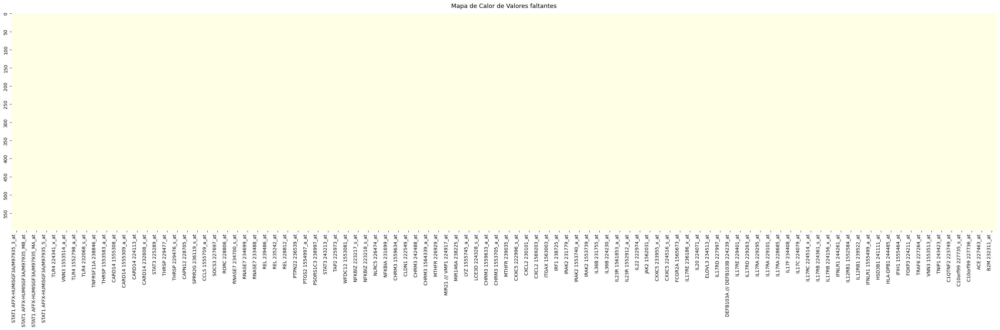

In [ ]:
# Fondo blanco limpio
fig, ax = plt.subplots(figsize=(30, 10))
#fig, ax = plt.subplots(figsize=(14, 7))

sns.heatmap(
    df[cols_imputar_num].isnull(),
    cmap="YlOrBr", # blanco=presente, naranja/café=faltante
    cbar=False,
    yticklabels=50, # un tick cada 50 filas
    xticklabels=True,
    ax=ax
)

# Fondo blanco explícito
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

ax.set_title("Mapa de Calor de Valores faltantes", fontsize=13, pad=12)
ax.tick_params(axis='x', rotation=45)

plt.xticks(rotation=90, ha='right')

plt.tight_layout()
plt.savefig("mapa_calor_missings_v2.png", dpi=150, bbox_inches="tight")
plt.show()

---
## 5. Análisis Univariante
### 5.1 Variable Objetivo

Se verifica la distribución de clases y el grado de desbalance.

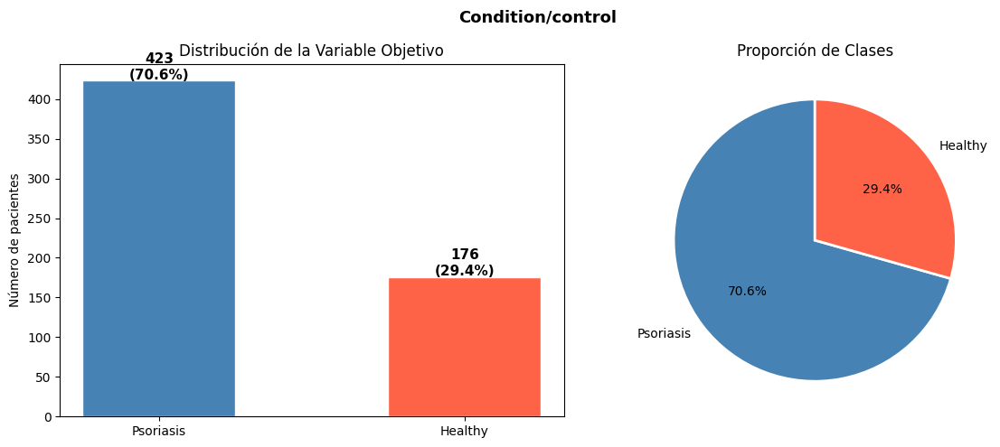

Ratio de desbalance: 2.40:1 → Desbalanceadas


In [ ]:
COLORES = ['steelblue', 'tomato']

conteo = df[VAR_OBJETIVO].value_counts()
pct    = df[VAR_OBJETIVO].value_counts(normalize=True) * 100

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Barras
axes[0].bar(conteo.index, conteo.values, color=COLORES, edgecolor='white', width=0.5)
for i, (cnt, p) in enumerate(zip(conteo.values, pct.values)):
    axes[0].text(i, cnt + 2, f'{cnt}\n({p:.1f}%)', ha='center', fontsize=11, fontweight='bold')
axes[0].set_title('Distribución de la Variable Objetivo')
axes[0].set_ylabel('Número de pacientes')

# Pastel
axes[1].pie(conteo.values, labels=conteo.index, colors=COLORES,
            autopct='%1.1f%%', startangle=90,
            wedgeprops={'edgecolor': 'white', 'linewidth': 2})
axes[1].set_title('Proporción de Clases')

plt.suptitle(VAR_OBJETIVO, fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

ratio = conteo.max() / conteo.min()
print(f'Ratio de desbalance: {ratio:.2f}:1 → {"Desbalanceadas" if ratio > 1.5 else "Razonablemente balanceadas"}')

### 5.2 Histogramas y Densidad (subplots)

Todos los histogramas se presentan en una cuadrícula de subplots para compactar el análisis. Se marca la mediana (línea roja) como referencia central.

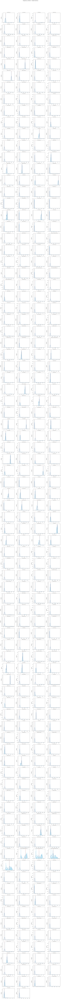

In [ ]:
N_COLS_HIST = 4
n_num = len(COLS_NUMERICAS)
n_filas_hist = (n_num + N_COLS_HIST - 1) // N_COLS_HIST

fig, axes = plt.subplots(n_filas_hist, N_COLS_HIST,
                         figsize=(N_COLS_HIST * 4, n_filas_hist * 3))
axes = axes.flatten()

for i, col in enumerate(COLS_NUMERICAS):
    ax = axes[i]
    datos = df[col].dropna()
    ax.hist(datos, bins=30, color='skyblue', edgecolor='white', density=True, alpha=0.7)
    ax.axvline(datos.median(), color='tomato', linestyle='-', linewidth=1.2, label='Mediana')
    # KDE
    try:
        sns.kdeplot(datos, ax=ax, color='steelblue', linewidth=1.5)
    except Exception:
        pass
    ax.set_title(col, fontsize=7)
    ax.set_xlabel('')
    ax.tick_params(labelsize=6)

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle('Histogramas y densidad — Variables Numéricas', fontsize=12, y=1.01)
plt.tight_layout()
plt.show()

### 5.3 Boxplots (subplots)

Los boxplots permiten ver la dispersión y los valores atípicos de cada variable numérica. Se muestran todos en una cuadrícula compacta.

> **Nota:** Los valores atípicos detectados en variables de expresión génica son biológicamente plausibles (variaciones extremas reales o estados críticos de la psoriasis).

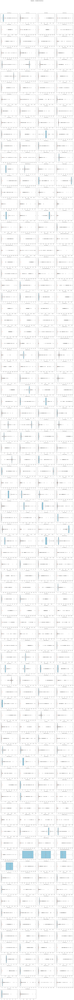

In [ ]:
N_COLS_BOX = 4
n_filas_box = (n_num + N_COLS_BOX - 1) // N_COLS_BOX

fig, axes = plt.subplots(n_filas_box, N_COLS_BOX,
                         figsize=(N_COLS_BOX * 4, n_filas_box * 2.5))
axes = axes.flatten()

# Filter COLS_NUMERICAS to exclude columns with all NaN values
# This ensures that sns.boxplot is not called with empty data,
# which causes the ValueError.
plottable_numeric_cols = [col for col in COLS_NUMERICAS if not df[col].dropna().empty]

for i, col in enumerate(plottable_numeric_cols):
    sns.boxplot(x=df[col], ax=axes[i], color='skyblue',
                showmeans=True,
                meanprops={'marker': 'D', 'markerfacecolor': 'tomato', 'markeredgecolor': 'tomato', 'markersize': 4})
    axes[i].set_title(col, fontsize=7)
    axes[i].set_xlabel('')
    axes[i].tick_params(labelsize=6)

# Hide any remaining empty subplots that were created based on the original n_num
for j in range(len(plottable_numeric_cols), len(axes)):
    axes[j].set_visible(False)

plt.suptitle('Boxplots — Variables Numéricas', fontsize=12, y=1.01)
plt.tight_layout()
plt.show()

---
## 6. Análisis Bivariante
### 6.1 Variable Objetivo vs Categóricas — Barras Apiladas Normalizadas

Se utilizan barras apiladas normalizadas (al 100%) para comparar la proporción de diagnóstico dentro de cada categoría, independientemente del tamaño de la muestra por grupo.

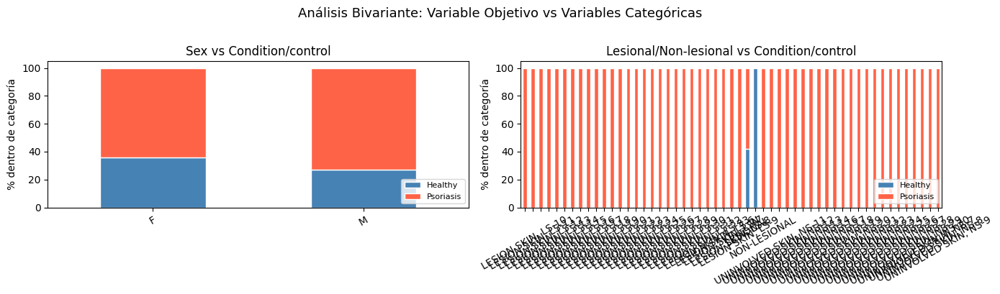

In [ ]:
cols_cat_biv = [c for c in COLS_CATEGORICAS if c in df.columns]
n_cat = len(cols_cat_biv)

if n_cat > 0:
    N_COLS_CAT = 2
    n_filas_cat = (n_cat + N_COLS_CAT - 1) // N_COLS_CAT

    fig, axes = plt.subplots(n_filas_cat, N_COLS_CAT,
                             figsize=(N_COLS_CAT * 7, n_filas_cat * 4))
    axes = axes.flatten() if n_cat > 1 else [axes]

    for i, col in enumerate(cols_cat_biv):
        ct = pd.crosstab(df[col], df[VAR_OBJETIVO], normalize='index') * 100
        ct.plot(kind='bar', stacked=True, ax=axes[i],
                color=COLORES, edgecolor='white', rot=0)
        axes[i].set_title(f'{col} vs {VAR_OBJETIVO}')
        axes[i].set_ylabel('% dentro de categoría')
        axes[i].set_xlabel('')
        axes[i].legend(loc='lower right', fontsize=8)
        axes[i].tick_params(axis='x', rotation=30)

    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    plt.suptitle('Análisis Bivariante: Variable Objetivo vs Variables Categóricas',
                 fontsize=13, y=1.01)
    plt.tight_layout()
    plt.show()
else:
    print('No hay variables categóricas disponibles para el análisis bivariante.')

### 6.2 Variable Objetivo vs Numéricas — Matriz Compacta

Se usa una cuadrícula con más columnas para compactar el análisis. Se ocultan los atípicos (`showfliers=False`) para poder apreciar mejor la variación central entre clases sin que los extremos distorsionen la escala visual.

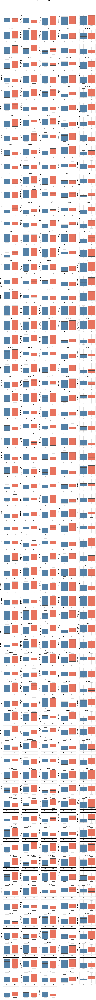

In [ ]:
N_COLS_BIV = 5
paleta = {v: c for v, c in zip(df[VAR_OBJETIVO].unique(), COLORES)}

# Filter COLS_NUMERICAS to exclude columns with all NaN values
# This ensures that sns.boxplot is not called with empty data,
# which can cause internal seaborn errors like UnboundLocalError.
plottable_numeric_cols = [col for col in COLS_NUMERICAS if not df[col].dropna().empty]

n_filas_biv = (len(plottable_numeric_cols) + N_COLS_BIV - 1) // N_COLS_BIV

fig, axes = plt.subplots(n_filas_biv, N_COLS_BIV,
                         figsize=(N_COLS_BIV * 4, n_filas_biv * 3))
axes = axes.flatten()

for i, col in enumerate(plottable_numeric_cols):
    sns.boxplot(data=df, x=VAR_OBJETIVO, y=col,
                ax=axes[i], palette=paleta,
                showfliers=False)   # Ocultar atípicos para ver la variación central
    axes[i].set_title(col, fontsize=7)
    axes[i].set_xlabel('')
    axes[i].tick_params(axis='x', labelsize=7, rotation=15)
    axes[i].tick_params(axis='y', labelsize=6)

for j in range(len(plottable_numeric_cols), len(axes)):
    axes[j].set_visible(False)

plt.suptitle('Análisis Bivariante: Variable Objetivo vs Variables Numéricas\n(atípicos ocultos para claridad visual)',
             fontsize=12, y=1.01)
plt.tight_layout()
plt.show()

---
## 7. Análisis de Correlación
### 7.1 Matriz Filtrada por Umbral

Dado que hay muchas variables numéricas, se filtra la matriz de correlación de Pearson para mostrar solo los pares con correlación absoluta mayor al umbral declarado. Esto facilita identificar redundancias.

In [ ]:
UMBRAL_CORR = 0.95

corr_matrix = df[COLS_NUMERICAS].corr()
mask_diag   = ~np.eye(corr_matrix.shape[0], dtype=bool)

# Filtrar columnas que tienen al menos un par con correlación > umbral
mask_cols = (corr_matrix.where(mask_diag).abs() > UMBRAL_CORR).any()
corr_filtrada = corr_matrix.loc[mask_cols, mask_cols]

if corr_filtrada.shape[0] > 0:
    fig_size = max(10, corr_filtrada.shape[0] * 0.5)
    fig, ax = plt.subplots(figsize=(fig_size, fig_size * 0.8))
    sns.heatmap(corr_filtrada.round(2), cmap='coolwarm', fmt='.2f',
                annot_kws={'size': 6}, ax=ax)
    ax.set_title(f'Matriz de correlación de Pearson (|r| > {UMBRAL_CORR})', fontsize=11)
    plt.tight_layout()
    plt.show()
else:
    print(f'Ningún par de variables supera el umbral de correlación de {UMBRAL_CORR}.')

# Tabla de pares
corr_pares = (corr_matrix.where(np.triu(mask_diag))
              .stack()
              .reset_index())
corr_pares.columns = ['Variable 1', 'Variable 2', 'Correlación']
corr_pares = (corr_pares[corr_pares['Correlación'].abs() > UMBRAL_CORR]
              .sort_values('Correlación', ascending=False))

print(f'\nPares con |r| > {UMBRAL_CORR}: {len(corr_pares)}')
display(corr_pares.head(30))


Pares con |r| > 0.95: 1183


,Variable 1,Variable 2,Correlación
52675,PI3 203691_at,PI3 41469_at,0.999543
54873,S100A8 202917_s_at,S100A8 214370_at,0.999232
28750,HLA-A 213932_x_at,HLA-A 215313_x_at,0.999069
7499,CCHCR1 37424_at,CCHCR1 42361_g_at,0.997781
47909,KRT10 207023_x_at,KRT10 213287_s_at,0.997694
29926,HLA-C 208812_x_at,HLA-C 214459_x_at,0.996750
29224,HLA-B 208729_x_at,HLA-B 211911_x_at,0.996054
1540,AQP3 39248_at,KRT10 207023_x_at,0.995762
49932,MAP3K7 211536_x_at,MAP3K7 211537_x_at,0.995379
28855,HLA-A 213932_x_at,KRT14 209351_at,0.994972


---
## 8. PCA Exploratorio
### 8.1 Proyección 2D Coloreada por Clase del Target

En el EDA es habitual proyectar los datos en dos dimensiones (PC1 y PC2) mediante PCA y colorear los puntos según la clase del target. Esto permite explorar visualmente si existe una separación aproximada entre clases en el espacio reducido, dando una primera intuición sobre la estructura del problema.

> **Nota metodológica:** El PCA se usa aquí exclusivamente como herramienta visual exploratoria. Si en la siguiente etapa se descartara como técnica de reducción de dimensionalidad (porque elimina la interpretación directa de cada variable clínica), el hallazgo aquí obtenido seguirá siendo válido como evidencia del potencial discriminativo del conjunto.

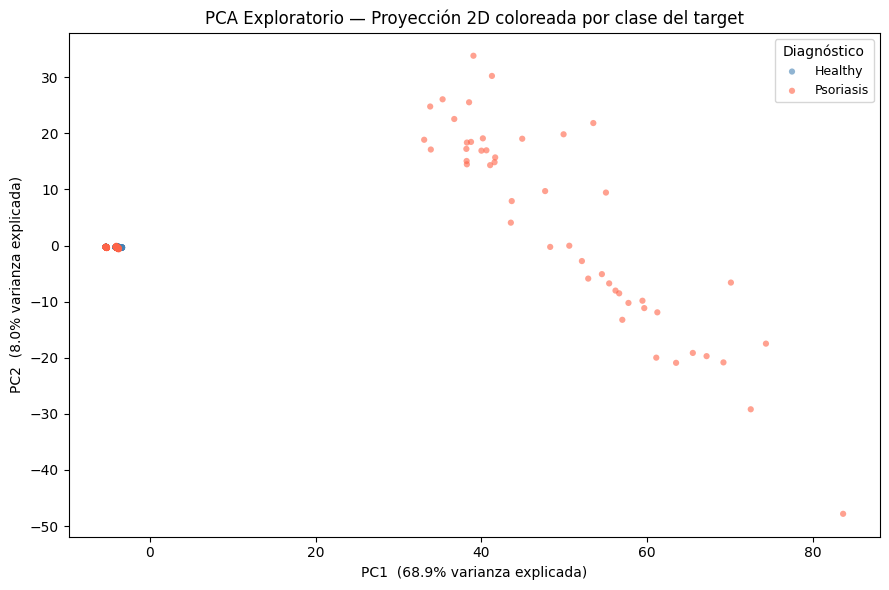

Varianza total explicada por PC1+PC2: 76.9%


In [ ]:
X_pca = df[COLS_NUMERICAS].copy()

# Escalar antes del PCA
scaler_pca = StandardScaler()
X_scaled   = scaler_pca.fit_transform(X_pca)

# PCA a 2 componentes
pca   = PCA(n_components=2, random_state=42)
comps = pca.fit_transform(X_scaled)

var_exp = pca.explained_variance_ratio_ * 100

pca_df = pd.DataFrame({
    'PC1':   comps[:, 0],
    'PC2':   comps[:, 1],
    'Clase': df[VAR_OBJETIVO].values
})

# Gráfico
fig, ax = plt.subplots(figsize=(9, 6))
for clase, color in zip(pca_df['Clase'].unique(), COLORES):
    subset = pca_df[pca_df['Clase'] == clase]
    ax.scatter(subset['PC1'], subset['PC2'],
               label=clase, alpha=0.6, s=20, color=color, edgecolors='none')

ax.set_xlabel(f'PC1  ({var_exp[0]:.1f}% varianza explicada)')
ax.set_ylabel(f'PC2  ({var_exp[1]:.1f}% varianza explicada)')
ax.set_title('PCA Exploratorio — Proyección 2D coloreada por clase del target')
ax.legend(title='Diagnóstico', fontsize=9)
plt.tight_layout()
plt.show()

print(f'Varianza total explicada por PC1+PC2: {var_exp.sum():.1f}%')

**Top 10 de caracteristicas del primer componente**

In [ ]:
loadings_pc1_con_signo = pd.Series(pca.components_[0],index=COLS_NUMERICAS).sort_values(key=abs, ascending=False)
print(loadings_pc1_con_signo.head(10))

STAT1 200887_s_at             0.064791
REL 235242_at                 0.064283
NFKBIZ 223218_s_at            0.064200
MIR21 /// VMP1 220990_s_at    0.064120
IFNGR2 201642_at              0.064003
STAT3 225289_at               0.063991
STAT3 208991_at               0.063979
HIF1A 200989_at               0.063920
TRAF3IP2 215411_s_at          0.063883
MAP3K7 206854_s_at            0.063868
dtype: float64


PCA por la variable Lesional/Non-lesional

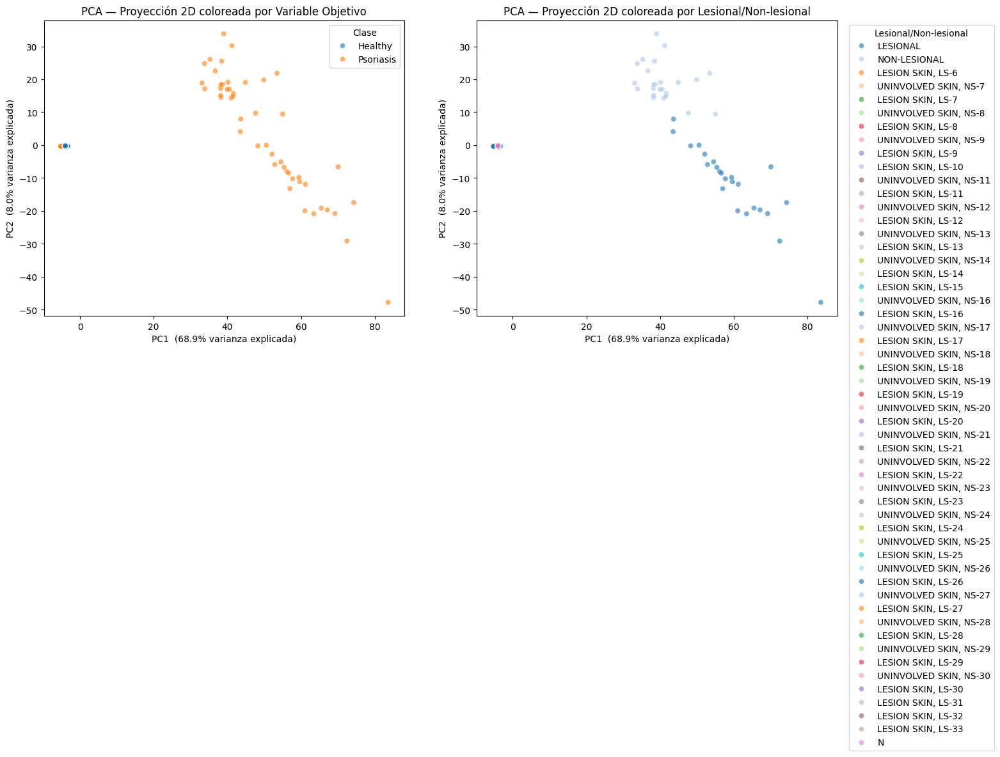

Varianza total explicada por PC1+PC2: 76.9%


In [ ]:
VAR_EXTRA = 'Lesional/Non-lesional'

pca_df = pd.DataFrame({
    'PC1': comps[:, 0],
    'PC2': comps[:, 1],
    'Clase': df[VAR_OBJETIVO].values,
    'Categoria_Extra': df[VAR_EXTRA].values
})

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Gráfico izquierdo — Variable objetivo
sns.scatterplot(
    data=pca_df, x='PC1', y='PC2',
    hue='Clase', alpha=0.6,
    ax=axes[0]
)
axes[0].set_xlabel(f'PC1  ({var_exp[0]:.1f}% varianza explicada)')
axes[0].set_ylabel(f'PC2  ({var_exp[1]:.1f}% varianza explicada)')
axes[0].set_title('PCA — Proyección 2D coloreada por Variable Objetivo')

# Gráfico derecho — Variable extra
sns.scatterplot(
    data=pca_df, x='PC1', y='PC2',
    hue='Categoria_Extra', palette='tab20', alpha=0.6,
    ax=axes[1]
)
axes[1].set_xlabel(f'PC1  ({var_exp[0]:.1f}% varianza explicada)')
axes[1].set_ylabel(f'PC2  ({var_exp[1]:.1f}% varianza explicada)')
axes[1].set_title(f'PCA — Proyección 2D coloreada por {VAR_EXTRA}')
axes[1].legend(title=VAR_EXTRA, bbox_to_anchor=(1.02, 1), loc='upper left')

plt.tight_layout()
plt.savefig("pca_espejo.png", dpi=150, bbox_inches="tight")
plt.show()

print(f'Varianza total explicada por PC1+PC2: {var_exp.sum():.1f}%')

---
## 9. Conclusiones Finales

*(Completar con los hallazgos específicos una vez ejecutado el notebook con los datos reales.)*

**1. Limpieza y variables eliminadas:**  
Se eliminaron las columnas de metadatos de estudio, control interno y *data leakage* antes de cualquier análisis, reduciendo el ruido y enfocando la exploración en variables clínicamente relevantes. También se eliminaron las columnas con más del 50 % de valores faltantes.

**2. Tratamiento de la categoría Atopic dermatitis en la variable objetivo:**  
Durante la revisión de la variable `Condition/control` se detectó la clase *Atopic dermatitis*. Tras consultar con las expertas del dominio (Dra. Mariana, comunicación personal, mayo 2026), se determinó que **no es correcto reclasificar estos pacientes como controles sanos**, ya que presentan una condición inflamatoria cutánea activa y un perfil inmunológico distinto al de individuos verdaderamente sanos. Hacerlo introduciría sesgo biológico en el modelo dado que ambas enfermedades comparten componentes inflamatorios pero difieren en sus mecanismos moleculares.

**Decisión adoptada:** Se creó la columna indicadora `Atopic_dermatitis` para preservar la información y dejar abierta la posibilidad de un análisis multi-enfermedad futuro. Los registros correspondientes se **excluyen** del estudio binario Psoriasis vs. Control sano.

**3. Distribuciones:**  
La mayoría de las variables de expresión génica presentan distribuciones asimétricas y leptocúrticas, lo que sugiere el uso de modelos no lineales o la aplicación rigurosa de transformaciones antes de modelar con algoritmos paramétricos.

**4. Valores atípicos:**  
Se detectaron atípicos en múltiples variables de expresión génica. Dada su naturaleza biológica, se conservan provisionalmente hasta confirmar su plausibilidad con las doctoras responsables del estudio.

**5. Correlación:**  
Se identificaron grupos de variables con correlaciones muy elevadas (> 0.95), indicando redundancia. En la etapa de Ingeniería de Características estos grupos serán tratados mediante *clustering* de correlaciones para seleccionar representantes.

**6. PCA exploratorio:**  
La proyección en dos componentes principales evidencia si existe separación visual entre clases. Este hallazgo orienta el nivel de dificultad esperado en el modelado posterior.

---
## 10. Bibliografía

[1] S. K. Mukhiya y U. Ahmed, *Hands-On Exploratory Data Analysis with Python*. Birmingham, UK: Packt Publishing, 2020.

[2] S. Galli, *Python Feature Engineering Cookbook*, 2.ª ed. Birmingham, UK: Packt Publishing, 2022.

[3] S. van Buuren, *Flexible Imputation of Missing Data*, 2.ª ed. Boca Raton, FL: Chapman & Hall/CRC, 2018. Disponible en: https://stefvanbuuren.name/fimd/